In [20]:
import sys

%load_ext autoreload

%autoreload 2

import river.cluster as rcluster
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
from clustpy.partition import XMeans
from sklearn.cluster import KMeans, HDBSCAN
from dbhd_clustering.DBHDALGO import DBHD
from clustpy.metrics import unsupervised_clustering_accuracy, PairCountingScores
from river import metrics as rmetrics
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

from evaluate import printMetrics
from datahandler import load_data

from scipy.spatial import Voronoi, voronoi_plot_2d

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


(3000, 2)
3000


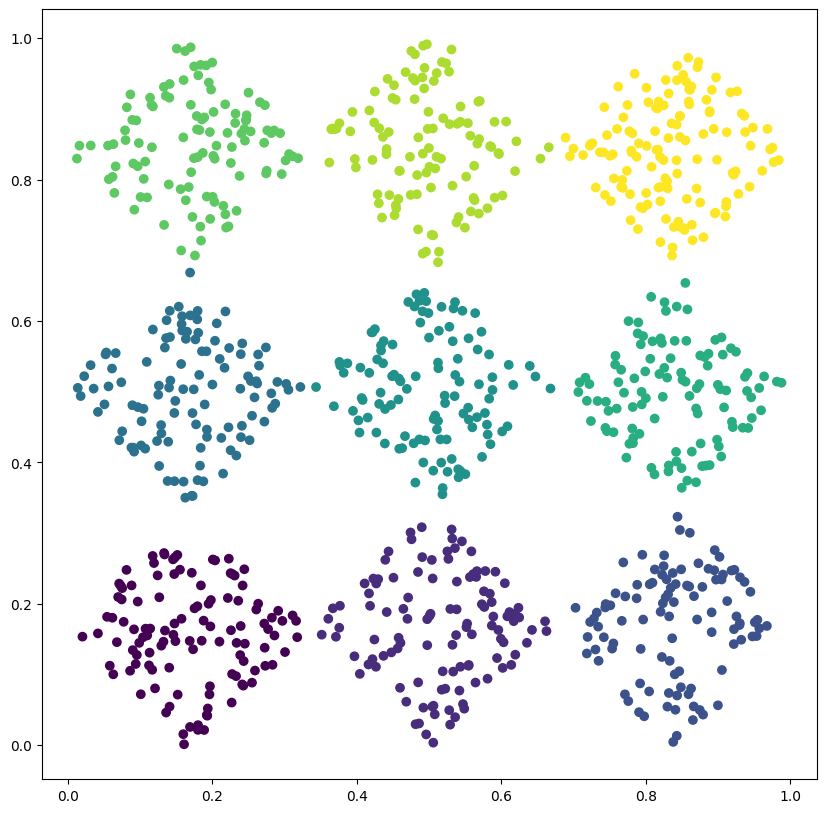

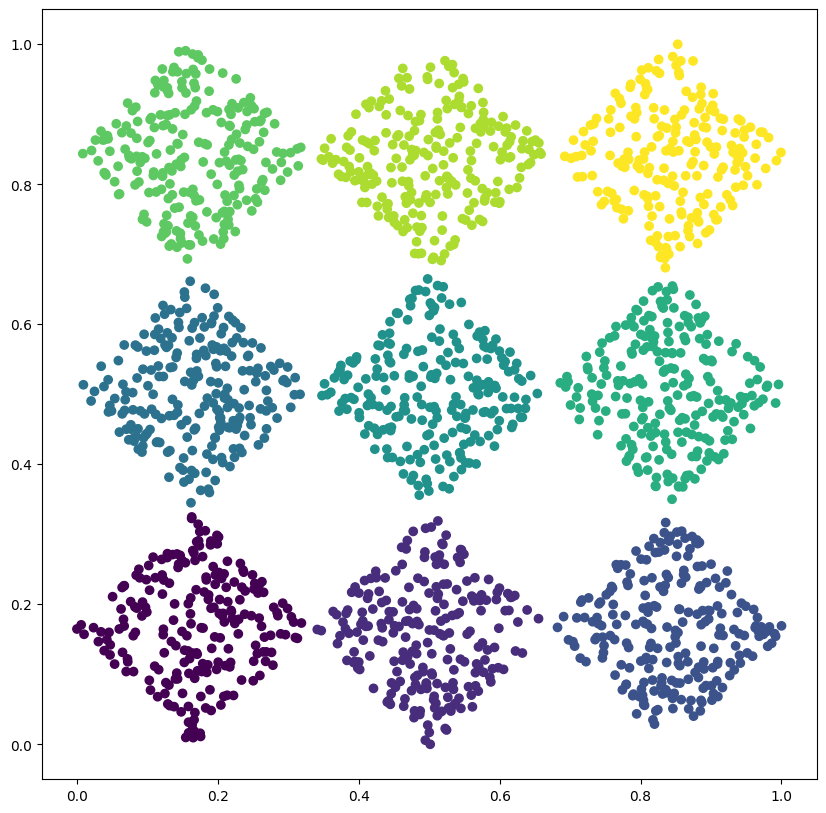

In [21]:
X, y = load_data("diamond9", "artificial", 2)
print(X.shape)
print(len(y))
c = 1000
X_test = X[c:]
y_test = y[c:]
X = X[:c]
y = y[:c]
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.show()
plt.figure(figsize=(10, 10))
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test)
plt.show()

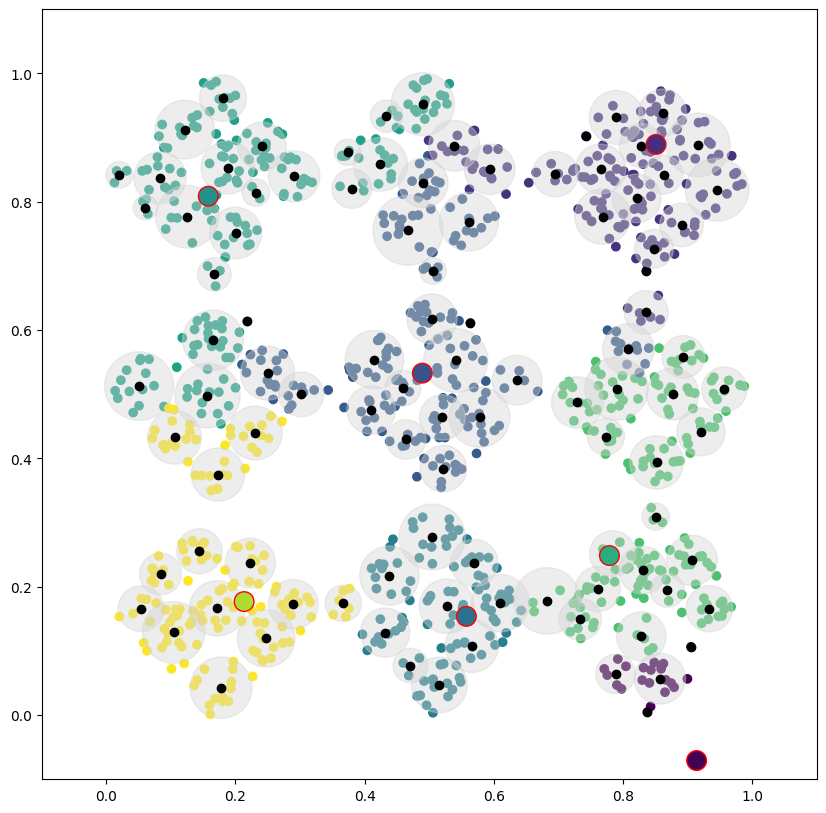

    0    1     2     3     4     5    6   7     8  
0    0     0     0     0     0    0   0   115   0  
1    0     0     0   105     0    2   0     6   0  
2   21     0     0     0     0   82   0     0   0  
3    0     0    21     0    52    0   0    37   0  
4    0     0   111     0     0    0   0     0   0  
5    0     6    12     0     0   88   0     0   0  
6    0     0     0     0   106    0   0     0   0  
7    0    24    43     0    40    0   0     0   0  
8    0   129     0     0     0    0   0     0   0  
Acc: 0.675 NMI: 0.7263291594877904 ARI: 0.5775175604392974 AMI: 0.7229210791761549 Pur.: 0.675 Prec.: 0.5296835858647275 Rec.: 0.7877669867795201 F1: 0.6334465232281662 Comp.: 0.796744618787194 Fowl.: 0.6459622608041646 Homo.: 0.667349505488111 Clu.Num.: 7 True Clu.Num 9


In [22]:
from utils import dict_to_np, dps_to_np
from competitors.clustream import CluStream

clustream = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
    dp = dict(enumerate(x))
    clustream.learn_one(dp)
clustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = clustream.predict_one(dp, recluster=True)
    clustream_labels_train.append(pred)

#vor = Voronoi(dps_to_np(clustream.centers.values()))
clustream_centers = dps_to_np(clustream.centers.values())
plt.figure(figsize=(10, 10))
#voronoi_plot_2d(vor, show_vertices=False, show_points=False)
plt.scatter(X[:, 0], X[:, 1], c=clustream_labels_train)
for id, mc in clustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=clustream.centers.keys(), s=200, edgecolors='red')
plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustream_labels_train))

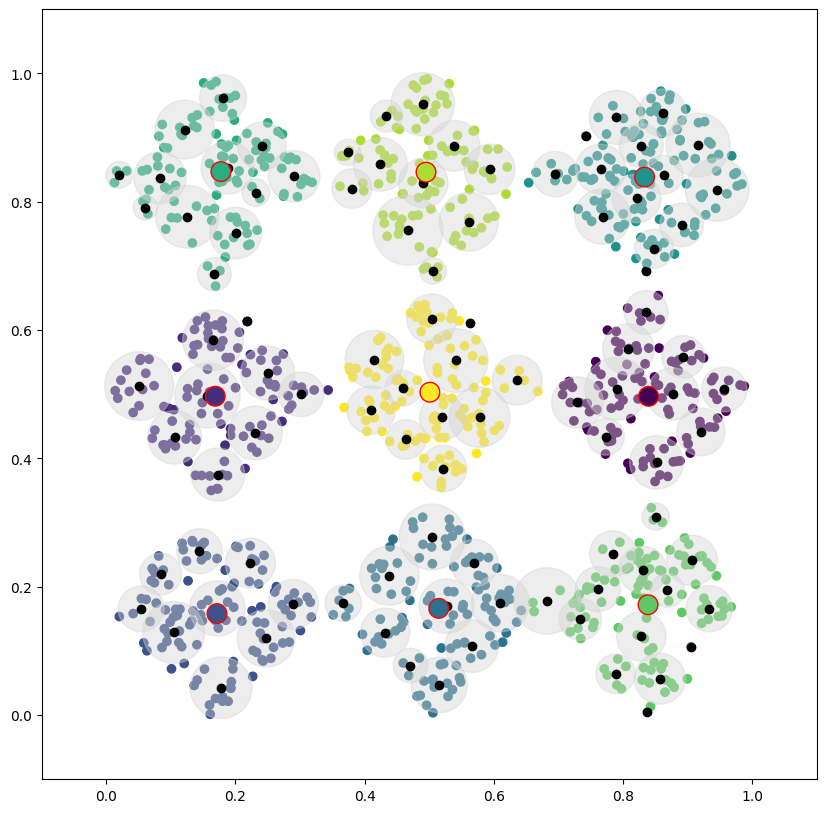

    0     1     2     3     4     5     6     7     8    
0     0     0   115     0     0     0     0     0     0  
1     0     0     0   111     0     0     2     0     0  
2     0     0     0     0     0     0   103     0     0  
3     0   109     0     0     0     1     0     0     0  
4     0     1     0     0     0     0     0     0   110  
5   106     0     0     0     0     0     0     0     0  
6     0     0     0     0     0   106     0     0     0  
7     0     0     0     0     2     0     0   105     0  
8     0     0     0     0   129     0     0     0     0  
Acc: 0.994 NMI: 0.9856477461406103 ARI: 0.9864791086688564 AMI: 0.9854315110477215 Pur.: 0.994 Prec.: 0.9877261799316716 Rec.: 0.9882263577668059 F1: 0.9879762055436021 Comp.: 0.9856978406910891 Fowl.: 0.98797623719642 Homo.: 0.9855976566816237 Clu.Num.: 9 True Clu.Num 9


In [23]:
from competitors.clustream import CluStream

clustream2 = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
    dp = dict(enumerate(x))
    clustream2.learn_one(dp)
clustream2_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = clustream2.predict_one(dp, recluster=True, sklearn=True)
    clustream2_labels_train.append(pred)

clustream_centers = clustream2._kmeans.cluster_centers_
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustream2_labels_train)
for id, mc in clustream2.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustream2_labels_train))

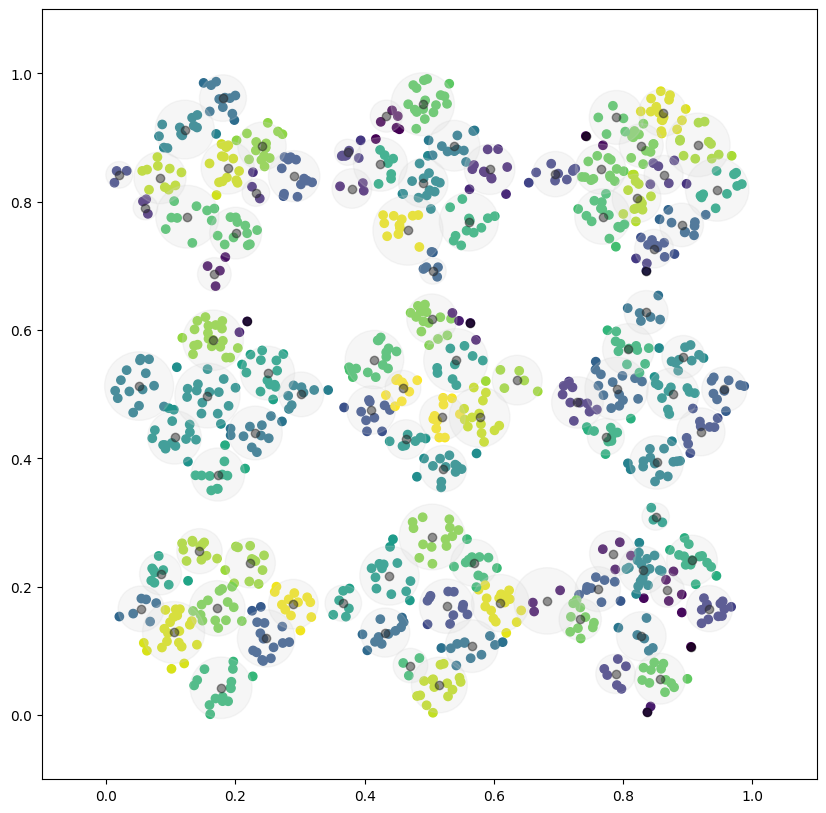

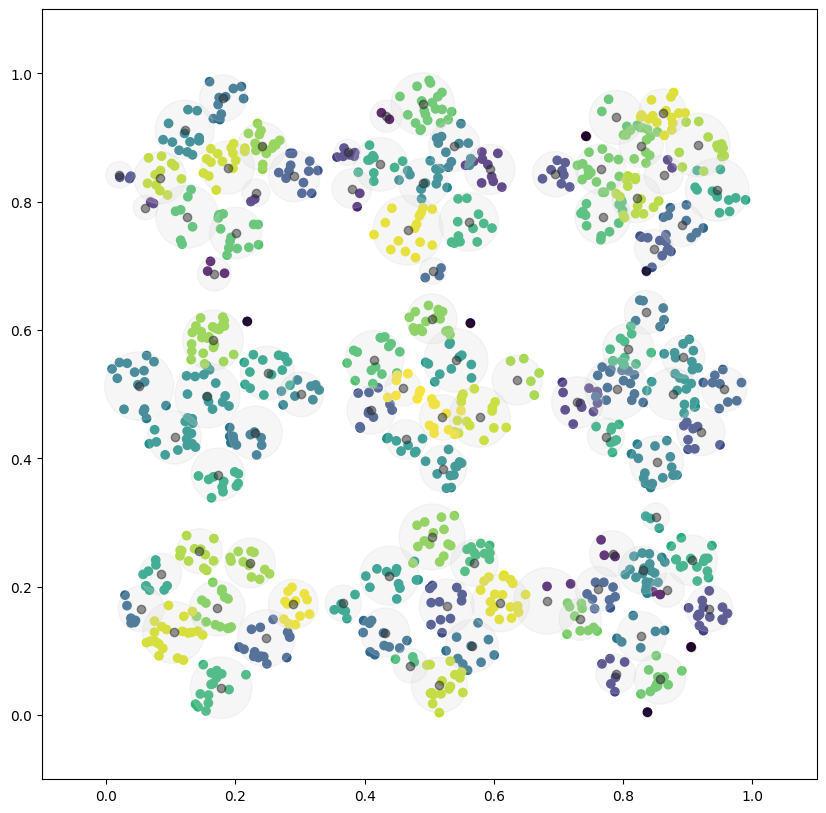

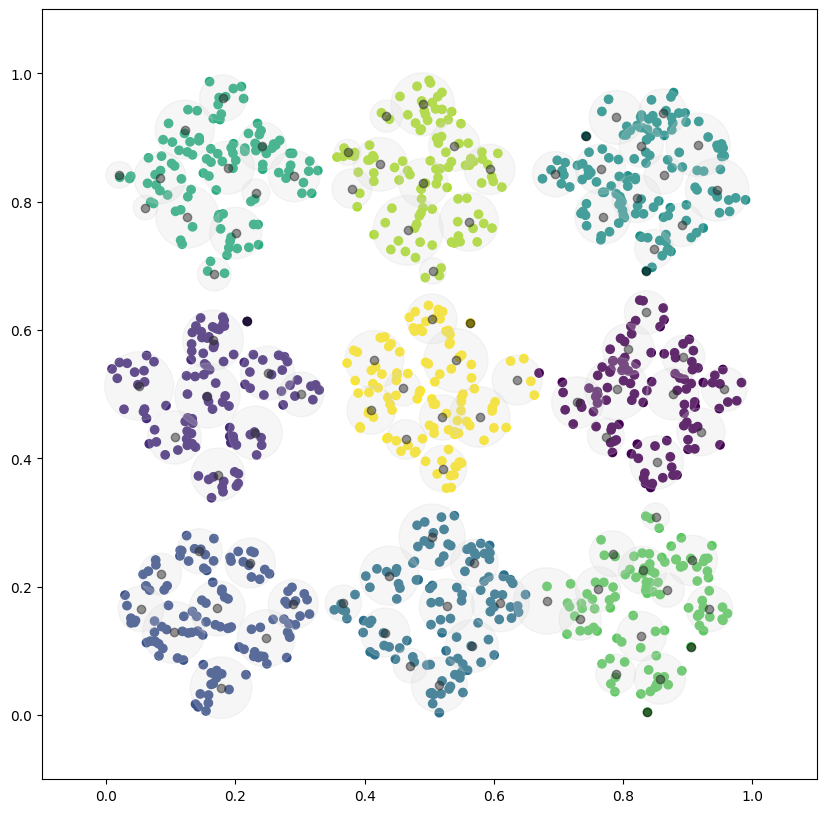

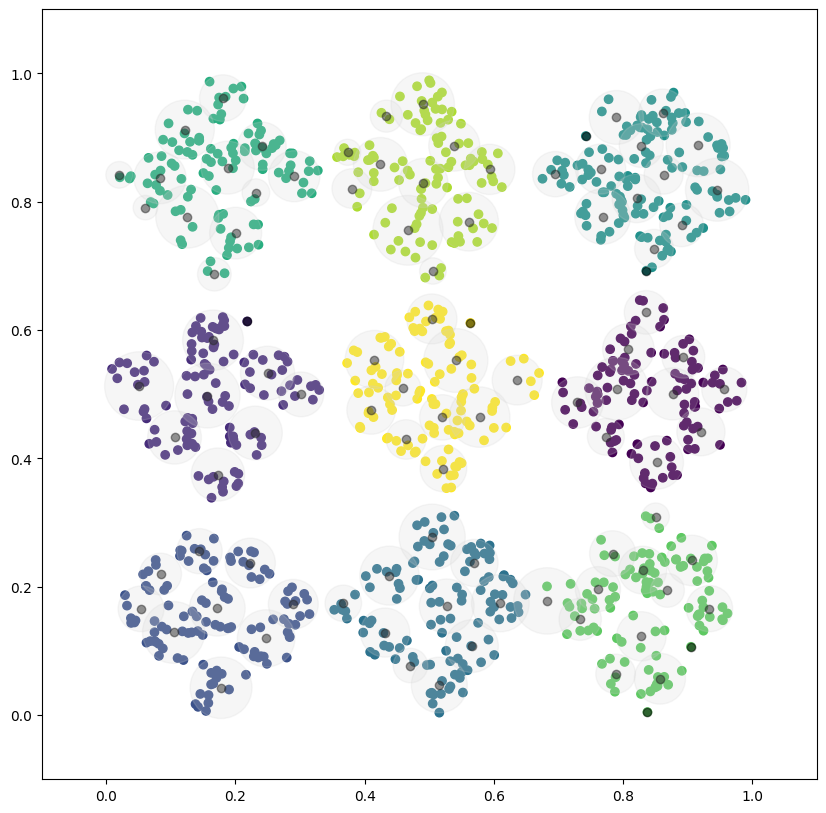

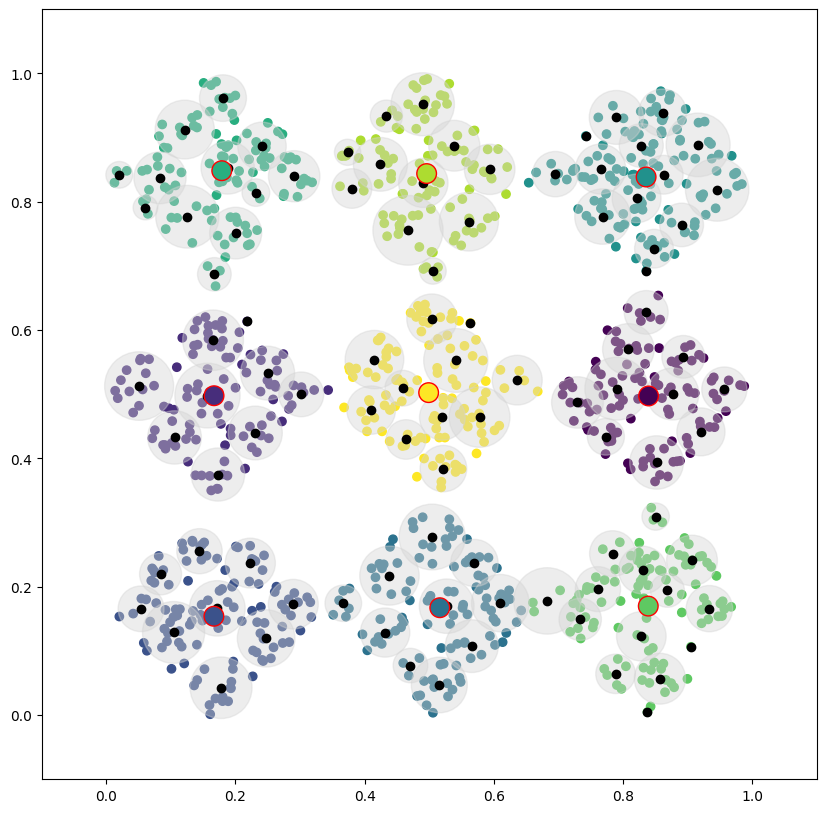

    0     1     2     3     4     5     6     7     8    
0     0     0   115     0     0     0     0     0     0  
1     0     0     0   111     0     0     2     0     0  
2     0     0     0     0     0     0   103     0     0  
3     0   109     0     0     0     1     0     0     0  
4     0     1     0     0     0     0     0     0   110  
5   106     0     0     0     0     0     0     0     0  
6     0     0     0     0     0   106     0     0     0  
7     0     0     0     0     2     0     0   105     0  
8     0     0     0     0   129     0     0     0     0  
Acc: 0.994 NMI: 0.9856477461406103 ARI: 0.9864791086688564 AMI: 0.9854315110477215 Pur.: 0.994 Prec.: 0.9877261799316716 Rec.: 0.9882263577668059 F1: 0.9879762055436021 Comp.: 0.9856978406910891 Fowl.: 0.98797623719642 Homo.: 0.9855976566816237 Clu.Num.: 9 True Clu.Num 9


In [24]:

from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000,
                            offline_datascale=1000)

for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)

genclustream.display_store()

genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

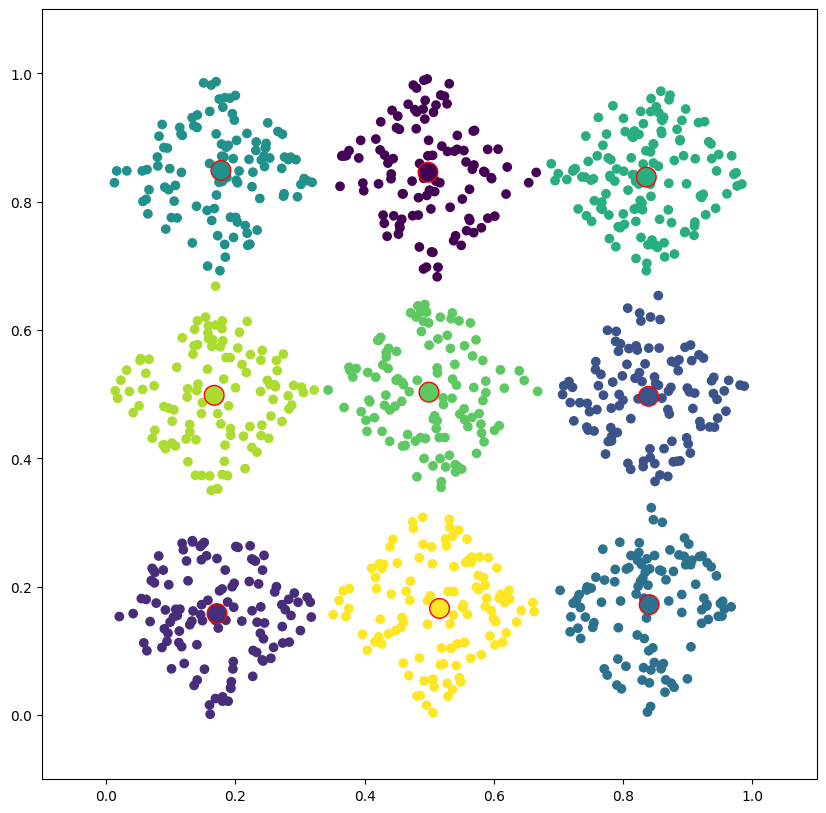

    0     1     2     3     4     5     6     7     8    
0     0   115     0     0     0     0     0     0     0  
1     0     0     0     0     0     0     0     0   113  
2     0     0     0   103     0     0     0     0     0  
3     0     0     0     0     0     0     0   110     0  
4     0     0     0     0     0     0   111     0     0  
5     0     0   106     0     0     0     0     0     0  
6     0     0     0     0   106     0     0     0     0  
7   107     0     0     0     0     0     0     0     0  
8     0     0     0     0     0   129     0     0     0  
Acc: 1.0 NMI: 1.0000000000000004 ARI: 1.0 AMI: 1.0000000000000004 Pur.: 1.0 Prec.: 1.0 Rec.: 1.0 F1: 1.0 Comp.: 1.0 Fowl.: 1.0 Homo.: 1.0 Clu.Num.: 9 True Clu.Num 9


In [25]:
kmeans = KMeans(n_clusters=9, random_state=0)
clustering = kmeans.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(kmeans.cluster_centers_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


74 New MC 74
100 New DP: 100, [{0: 0.7818238553464953, 1: 0.47836934573840306}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 100.]
75 New MC 75
102 New MC merge: 10 + 14 -> 102 [{0: 0.17206918944447724, 1: 0.352722100029175}, extents=+/- {0: 0.0006382566014185576, 1: 0.00017111921113027728}, weight=2.0, time=Mean: 99.]
0 {0: 0.5623506194496217, 1: 0.8195149769971729} 0.0 0 [{0: 0.5623506194496217, 1: 0.8195149769971729}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 99.]
1 {0: 0.5381258802594182, 1: 0.19223176385955484} 0.0 1 [{0: 0.5381258802594182, 1: 0.19223176385955484}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 99.]
2 {0: 0.19699830484174308, 1: 0.7444088915575202} 0.0 2 [{0: 0.19699830484174308, 1: 0.7444088915575202}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 99.]
3 {0: 0.19599453501218658, 1: 0.07194664875731875} 0.0 3 [{0: 0.19599453501218658, 1: 0.07194664875731875}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 99.]
4 {0: 0.5868013797407504, 1: 0.1692

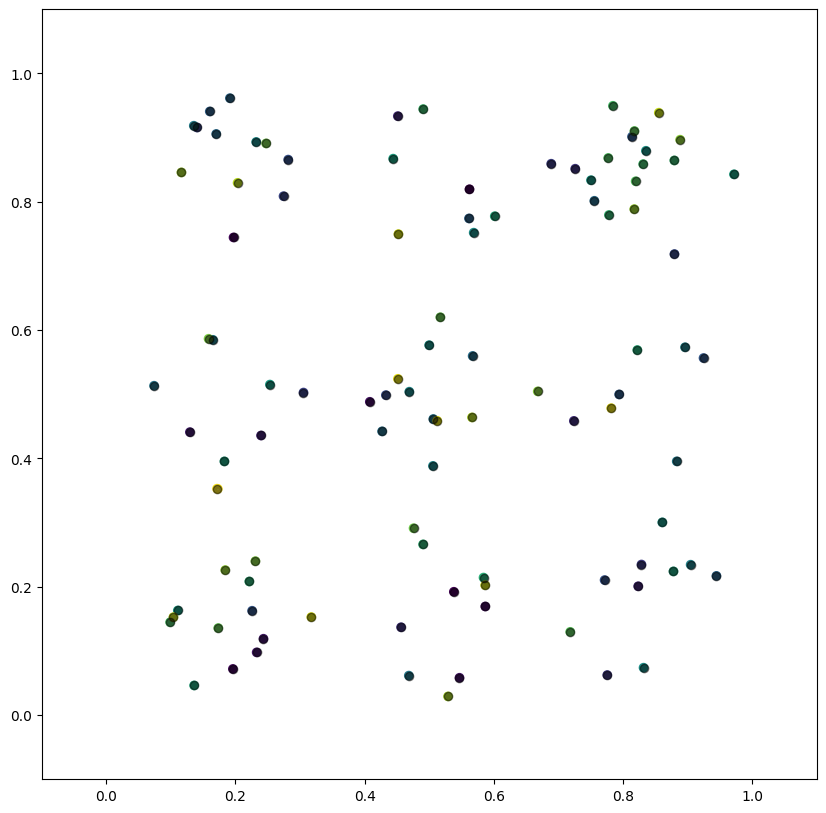

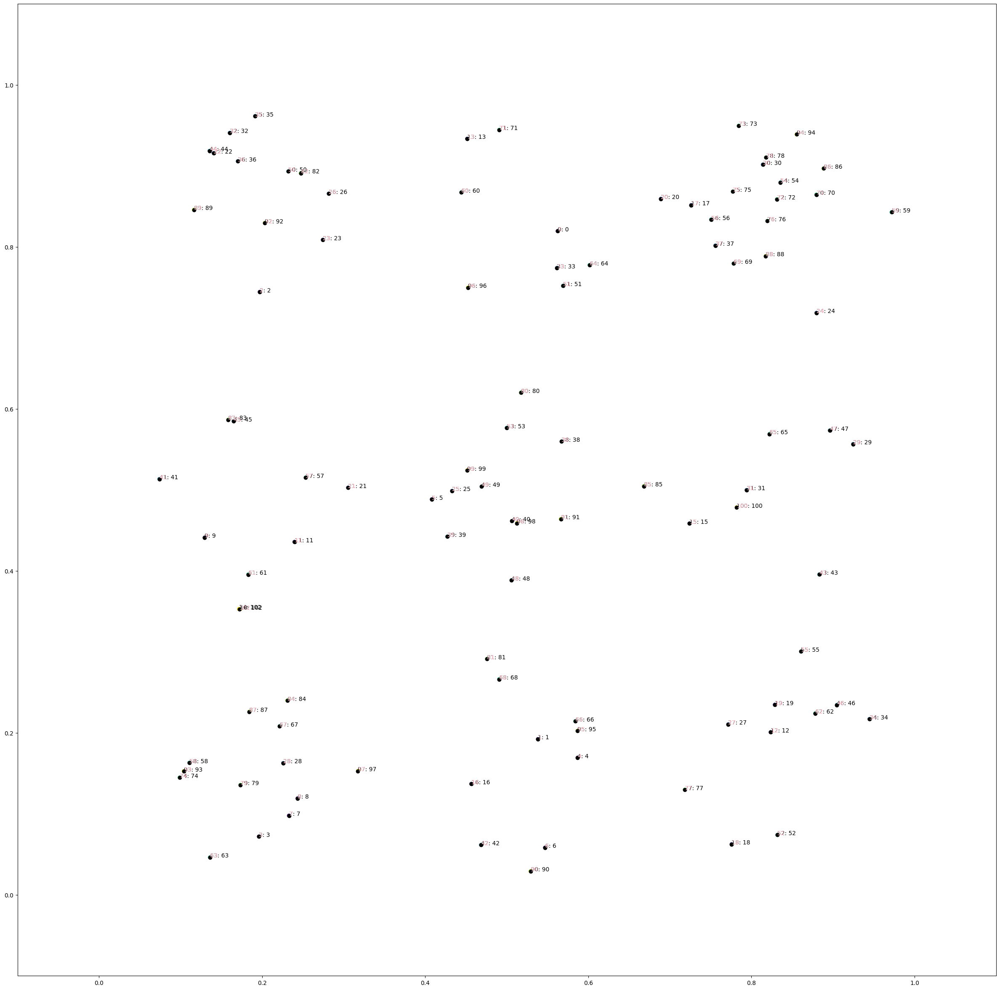

101 New DP: 103, [{0: 0.17655267219350104, 1: 0.5739758515213853}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 101.]
76 New MC 76
105 New MC merge: 22 + 44 -> 105 [{0: 0.13797491840469583, 1: 0.9171630535664124}, extents=+/- {0: 0.00251406306663407, 1: 0.0013960616828846417}, weight=2.0, time=Mean: 99.]
102 New DP: 106, [{0: 0.4597461479426176, 1: 0.08125858349211276}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 102.]
77 New MC 77
108 New MC merge: 54 + 72 -> 108 [{0: 0.8334089548210807, 1: 0.8691175229799546}, extents=+/- {0: 0.002164067705126782, 1: 0.010368807644725364}, weight=2.0, time=Mean: 99.]
103 New DP: 109, [{0: 0.05558095013198622, 1: 0.8481376299955373}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 103.]
78 New MC 78
111 New MC merge: 30 + 78 -> 111 [{0: 0.81587882570231, 1: 0.9059699934839159}, extents=+/- {0: 0.0018739510681183846, 1: 0.004363539883821876}, weight=2.0, time=Mean: 99.]
104 New DP: 112, [{0: 0.4477472949153686, 1: 0.1313292506435607}, extents

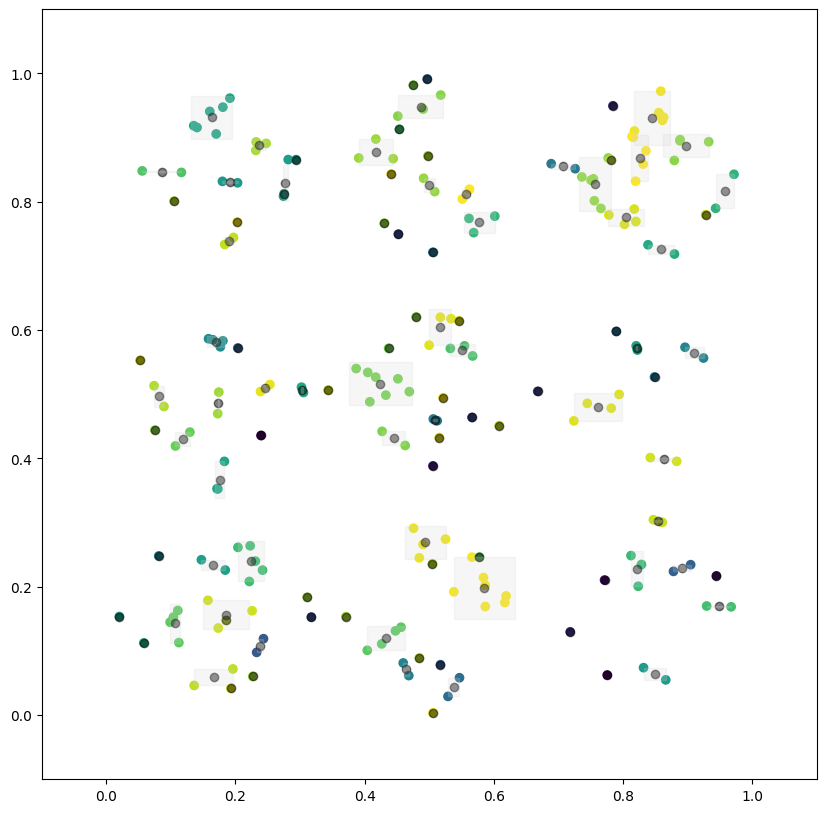

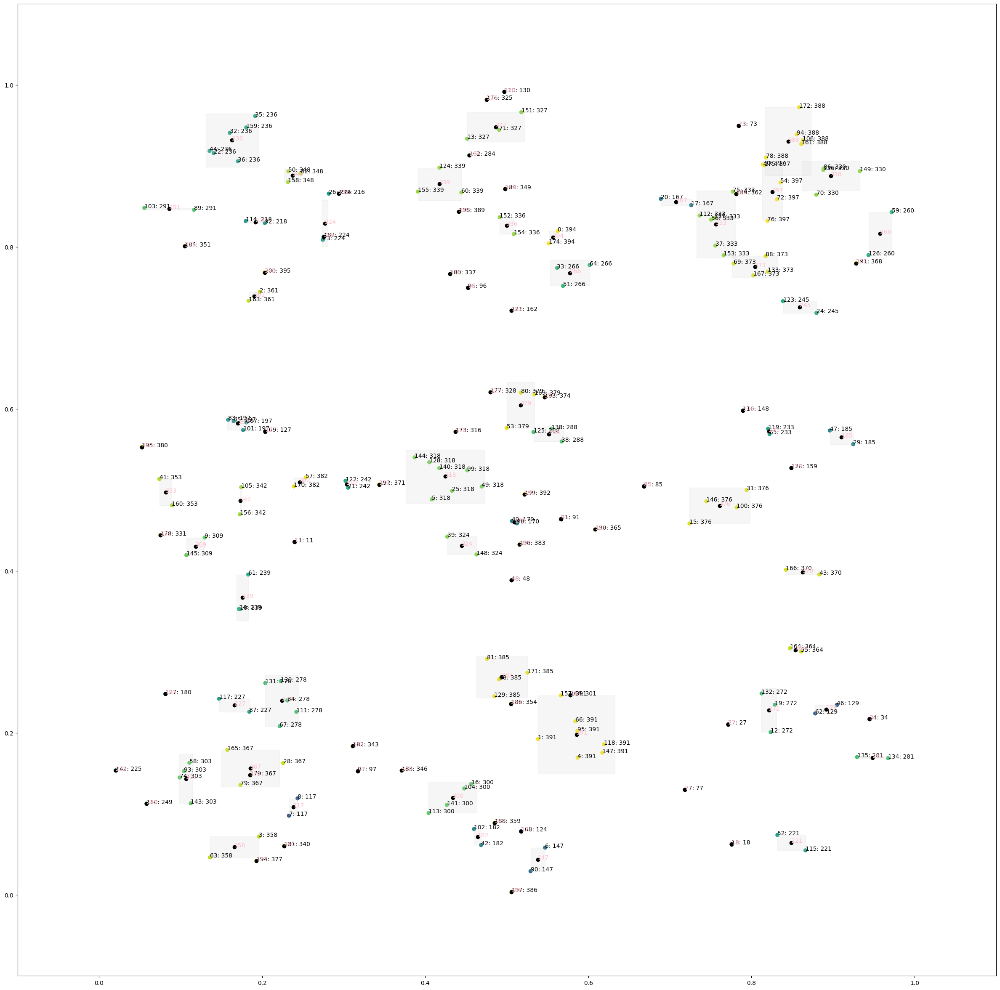

201 New DP: 398, [{0: 0.9569868351142334, 1: 0.16541273106599813}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 201.]
325 New MC 325
400 New MC merge: 130 + 325 -> 400 [{0: 0.4861062805191738, 1: 0.9866154280403054}, extents=+/- {0: 0.010763327233012598, 1: 0.004774395415496069}, weight=2.0, time=Mean: 143.]
202 New DP: 401, [{0: 0.5360208479164734, 1: 0.03973998012306354}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 202.]
401 directly inserted DP: 147 [{0: 0.5373269350245559, 1: 0.04237002027564991}, extents=+/- {0: 0.008886508733016774, 1: 0.014544455246226995}, weight=3.0, time=Mean: 133.333333], 401, True
328 New MC 328
403 New MC merge: 327 + 400 -> 403 [{0: 0.4863997706054498, 1: 0.9635031524902589}, extents=+/- {0: 0.03541480775555994, 1: 0.03359595331867915}, weight=5.0, time=Mean: 127.]
203 New DP: 404, [{0: 0.20065815995209704, 1: 0.26274626341718627}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 203.]
331 New MC 331
406 New MC merge: 309 + 331 -> 406 [{0: 0.1038

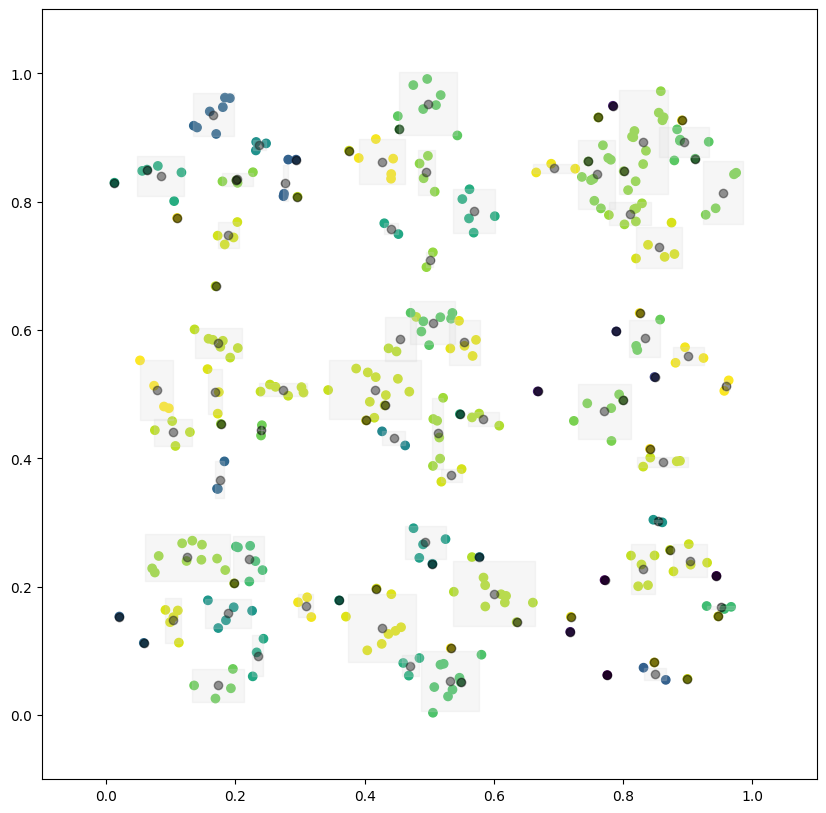

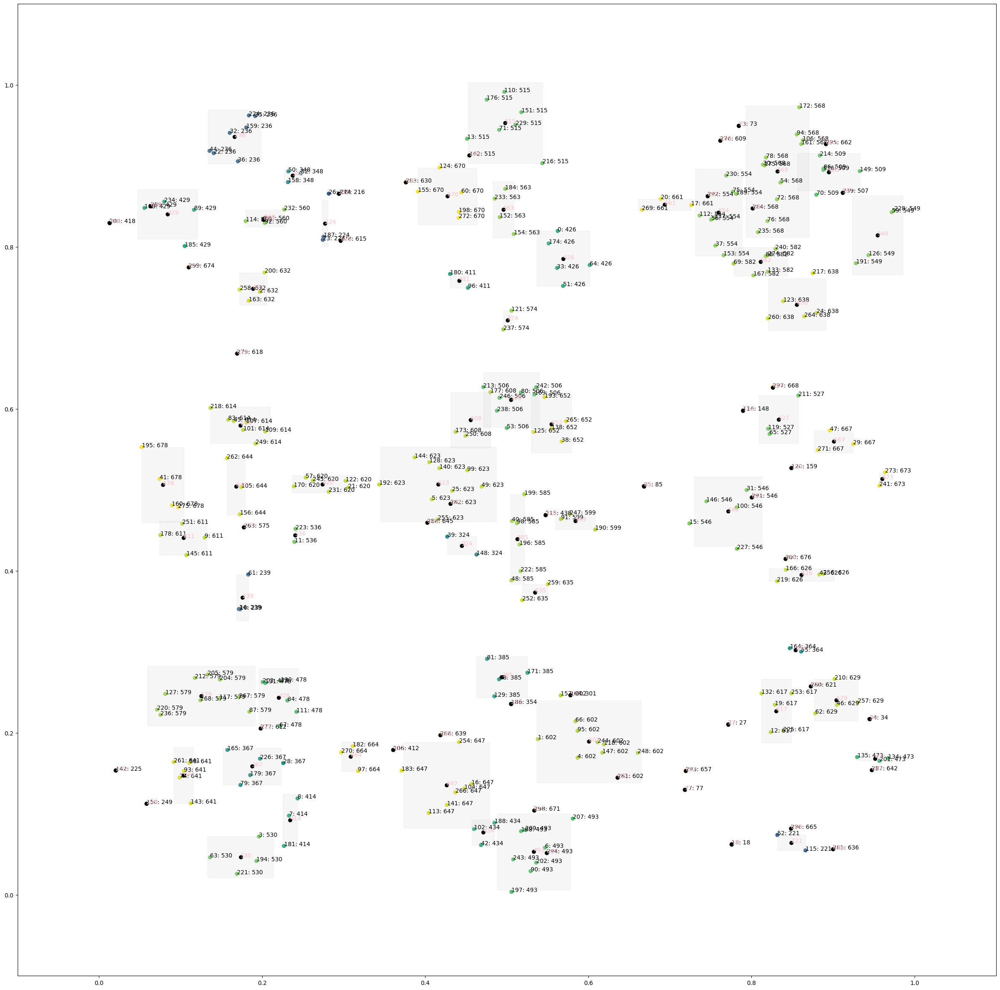

301 New DP: 679, [{0: 0.8717043509061928, 1: 0.4692271748150473}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 301.]
609 New MC 609
681 New MC merge: 73 + 609 -> 681 [{0: 0.7731009589029543, 1: 0.9405284500089625}, extents=+/- {0: 0.0113271992780819, 1: 0.009084566436440733}, weight=2.0, time=Mean: 187.5]
302 New DP: 682, [{0: 0.8946505528239987, 1: 0.24751936442597638}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 302.]
682 directly inserted DP: 629 [{0: 0.9019625041113912, 1: 0.24198594518289254}, extents=+/- {0: 0.0264921187791487, 1: 0.025861195550629407}, weight=5.0, time=Mean: 193.4], 682, True
612 New MC 612
684 New MC merge: 478 + 612 -> 684 [{0: 0.21705512336583493, 1: 0.2382405643729415}, extents=+/- {0: 0.02742964129391054, 1: 0.0409269310641619}, weight=7.0, time=Mean: 150.]
303 New DP: 685, [{0: 0.45066077437527935, 1: 0.2369923138671959}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 303.]
615 New MC 615
687 New MC merge: 224 + 615 -> 687 [{0: 0.281826216760982

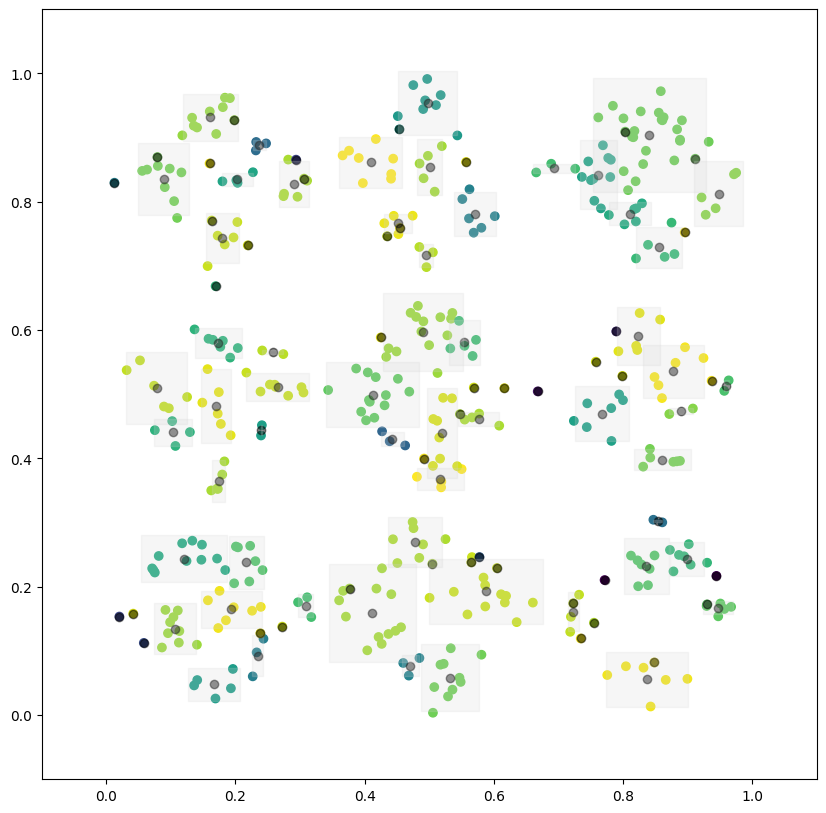

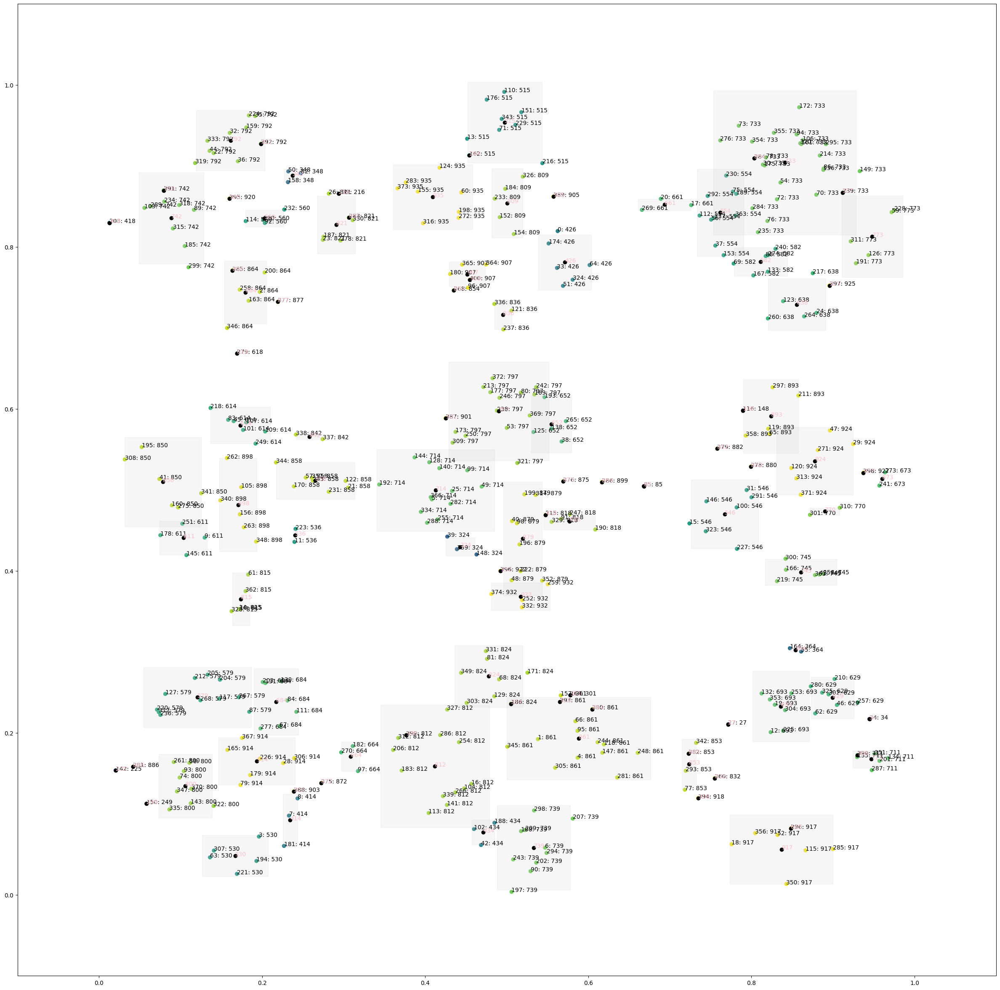

401 New DP: 936, [{0: 0.8984507434238822, 1: 0.8279946963210048}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 401.]
936 directly inserted DP: 733 [{0: 0.8432628676005498, 1: 0.9010068925462844}, extents=+/- {0: 0.08745450361501228, 1: 0.0889780992478777}, weight=25.0, time=Mean: 196.32], 936, True
875 New MC 875
938 New MC merge: 664 + 872 -> 938 [{0: 0.29944856754910476, 1: 0.1625806123966889}, extents=+/- {0: 0.026988226662056247, 1: 0.026166317199446065}, weight=4.0, time=Mean: 231.5]
402 New DP: 939, [{0: 0.8344209896013426, 1: 0.22260813463456222}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 402.]
939 directly inserted DP: 693 [{0: 0.8359075562452385, 1: 0.23162195673707256}, extents=+/- {0: 0.03471881697953405, 1: 0.04336360650817109}, weight=9.0, time=Mean: 238.555556], 939, True
877 New MC 877
941 New MC merge: 864 + 877 -> 941 [{0: 0.18496075353218214, 1: 0.7423235123169284}, extents=+/- {0: 0.03405335591937936, 1: 0.04057737509713499}, weight=7.0, time=Mean: 261.142

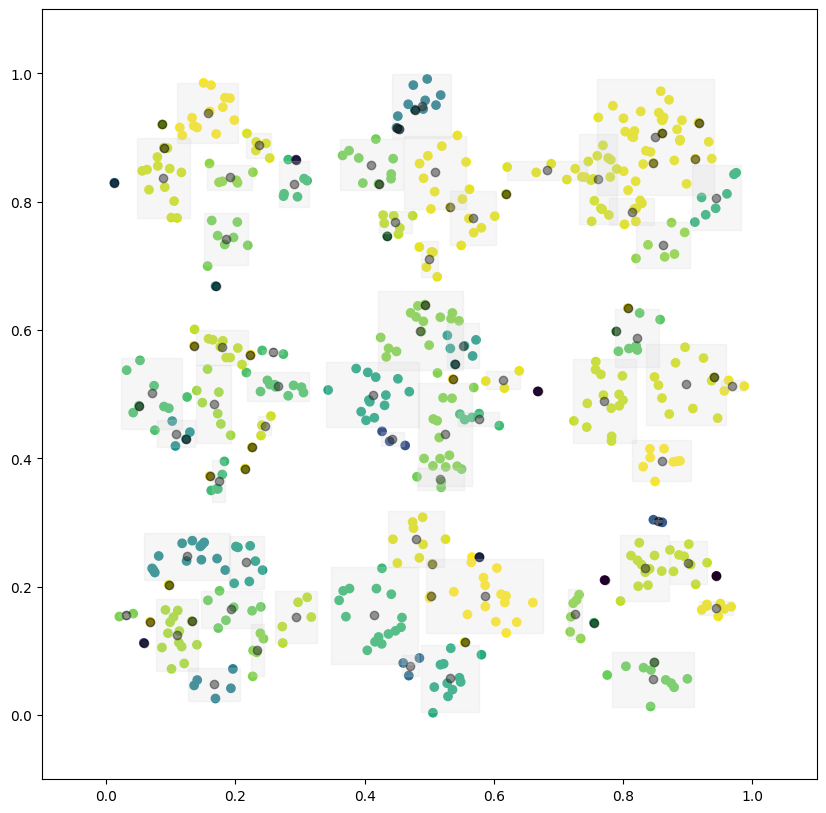

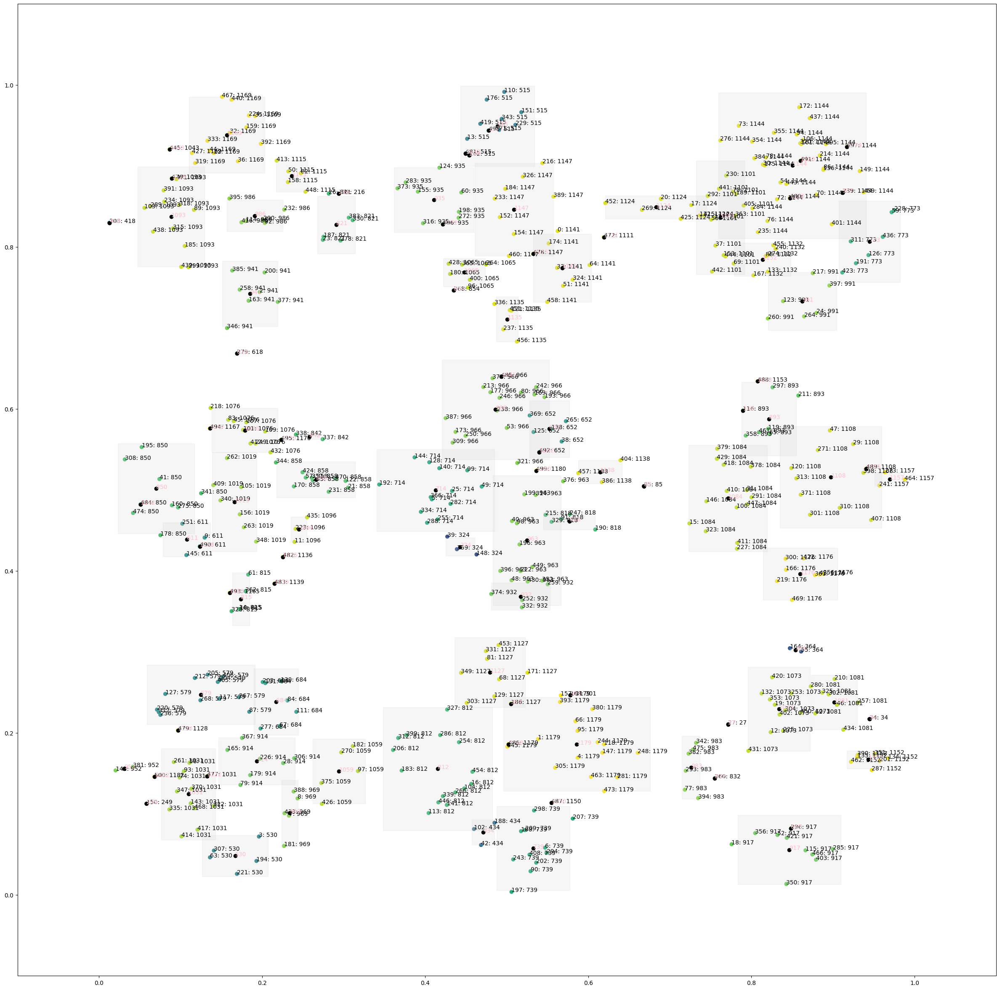

501 New DP: 1184, [{0: 0.20609902760324864, 1: 0.5967262353536357}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 501.]
1184 directly inserted DP: 1076 [{0: 0.1814227353613386, 1: 0.5759474497985368}, extents=+/- {0: 0.04048432591054016, 1: 0.027246922310861676}, weight=10.0, time=Mean: 232.7], 1184, True
502 New DP: 1186, [{0: 0.49176338626837474, 1: 0.989388914660308}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 502.]
1186 directly inserted DP: 515 [{0: 0.4888344311099491, 1: 0.9525059476632739}, extents=+/- {0: 0.045539155505168016, 1: 0.049690162891450895}, weight=12.0, time=Mean: 276.916667], 1186, True
503 New DP: 1188, [{0: 0.5860389802062864, 1: 0.8461163902046619}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 503.]
1125 MC insert: 1125 -> 1147 [{0: 0.5117961719784435, 1: 0.8390945726746678}, extents=+/- {0: 0.04819832508243882, 1: 0.057102989029056084}, weight=8.0, time=Mean: 297.]
504 New DP: 1190, [{0: 0.8121933323775227, 1: 0.4620350851987304}, extents=+/- {0: 0

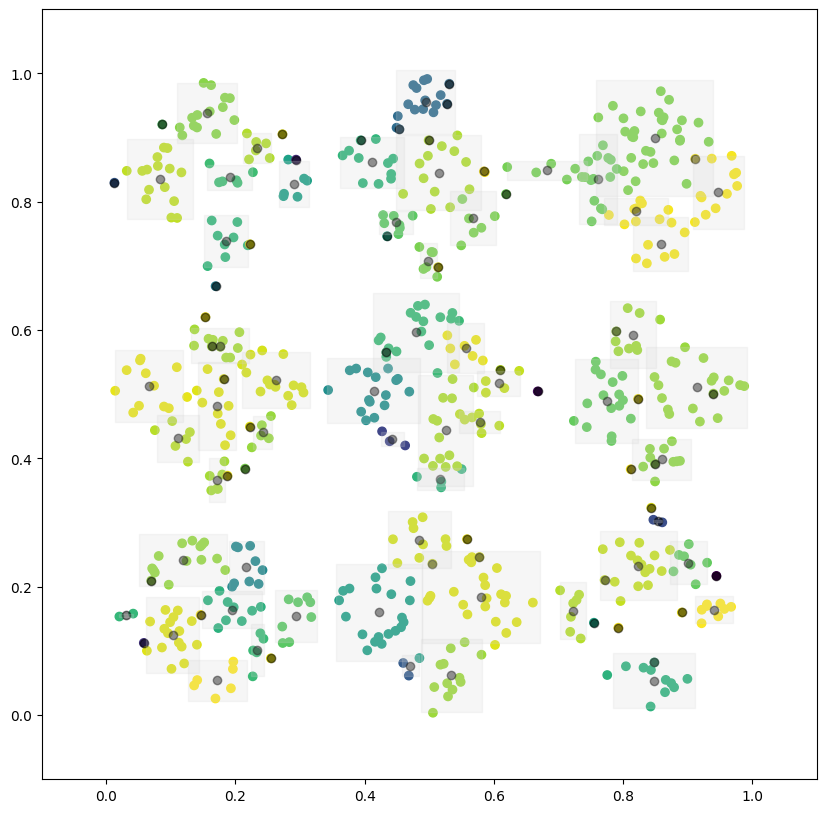

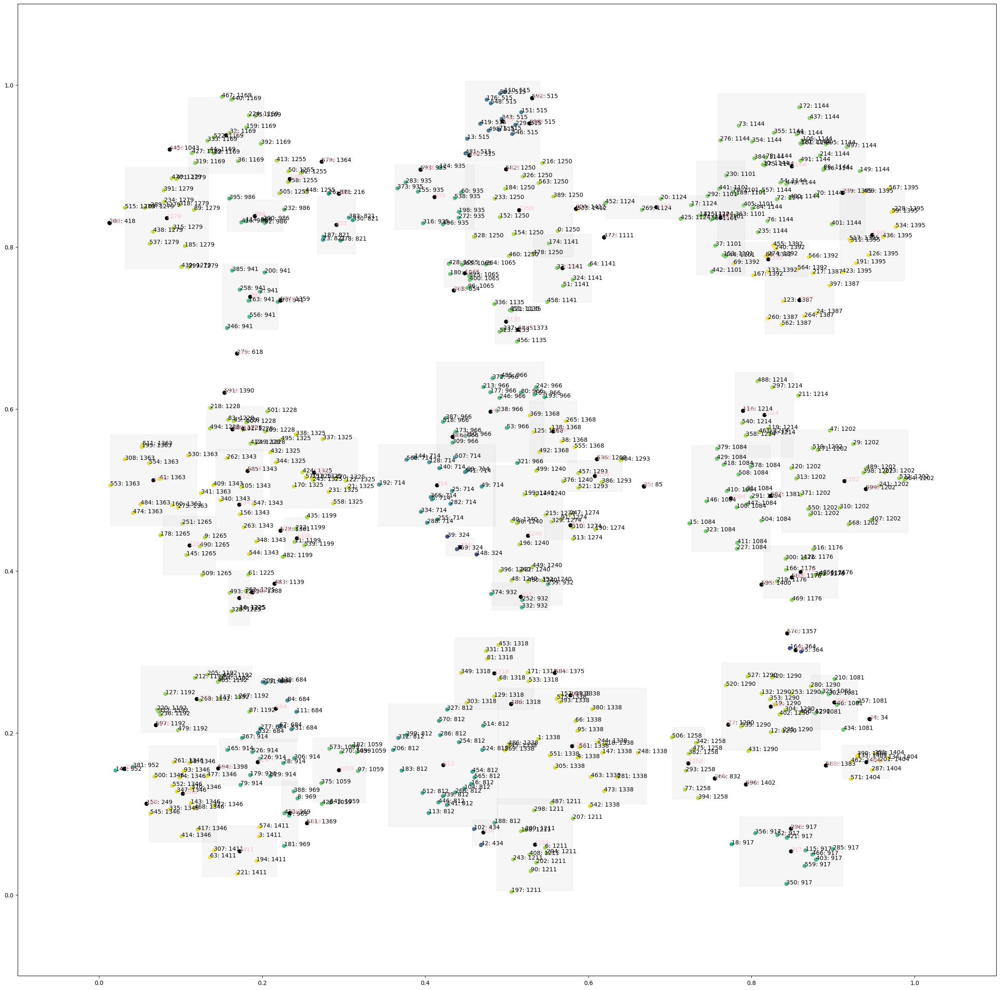

601 New DP: 1414, [{0: 0.12930937059870293, 1: 0.14081687906344592}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 601.]
1414 directly inserted DP: 1346 [{0: 0.10428204814011326, 1: 0.12580322072068073}, extents=+/- {0: 0.04128931925801786, 1: 0.05937425831352798}, weight=17.0, time=Mean: 355.823529], 1414, True
1357 New MC 1357
1416 New MC merge: 364 + 1357 -> 1416 [{0: 0.8505904941822057, 1: 0.3093664218024173}, extents=+/- {0: 0.010303638546155791, 1: 0.013843035905554413}, weight=3.0, time=Mean: 279.666667]
602 New DP: 1417, [{0: 0.8910224081367597, 1: 0.18797648652614107}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 602.]
1359 New MC 1359
1419 New MC merge: 941 + 1359 -> 1419 [{0: 0.18903932598483636, 1: 0.7382122677150833}, extents=+/- {0: 0.03821522244885908, 1: 0.041119229067802854}, weight=9.0, time=Mean: 329.]
603 New DP: 1420, [{0: 0.5003957055990824, 1: 0.8180935015700611}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 603.]
1420 directly inserted DP: 1250 [{0: 0

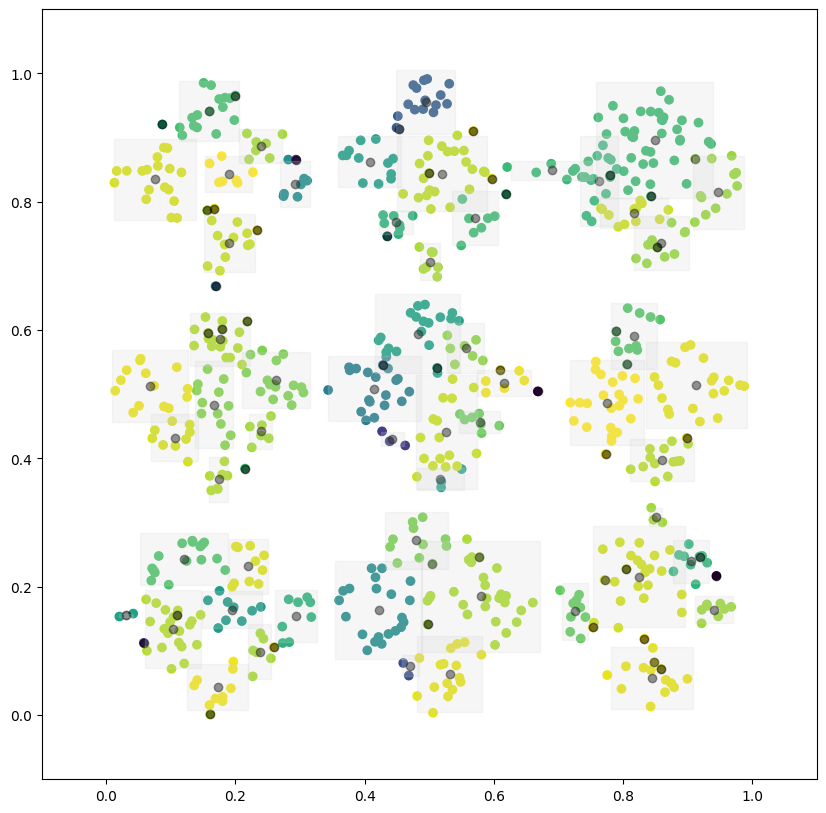

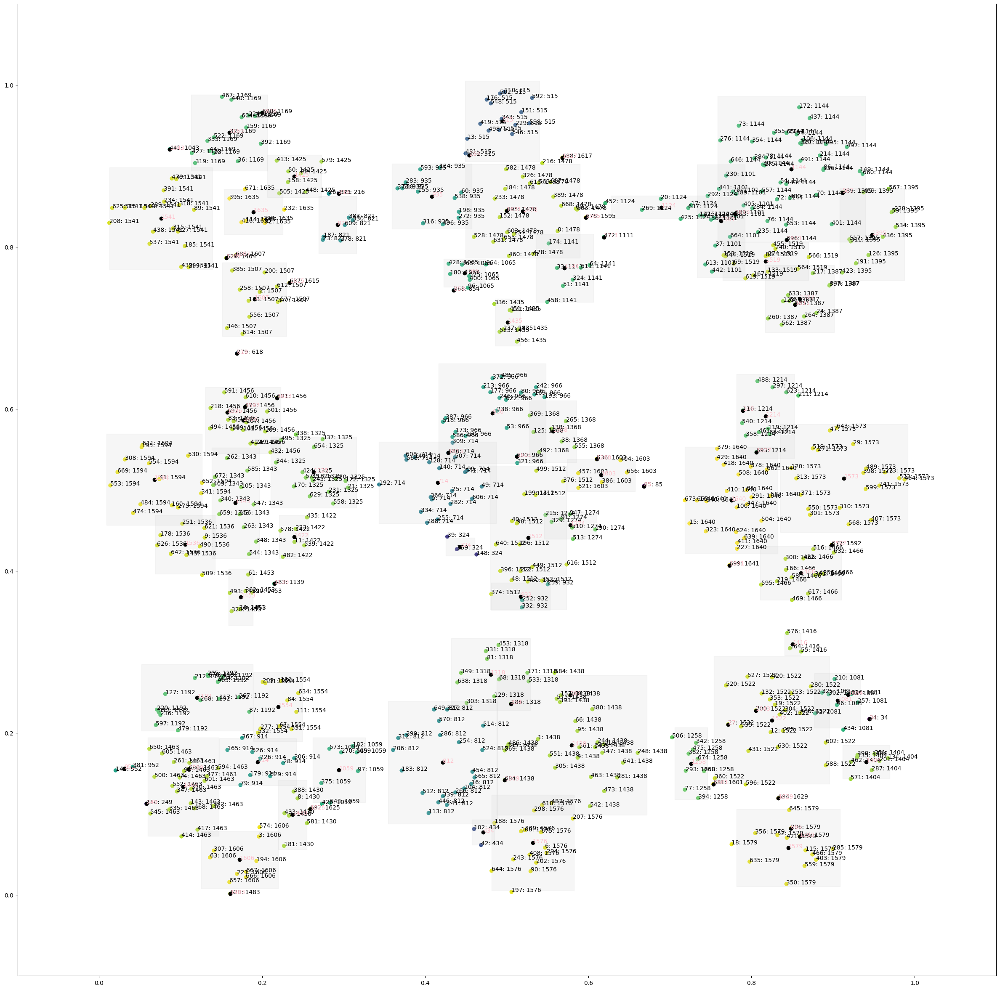

701 New DP: 1645, [{0: 0.7424506422204042, 1: 0.9024230819145969}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 701.]
702 New DP: 1647, [{0: 0.7889941217646512, 1: 0.7300094640783502}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 702.]
1592 New MC 1592
1649 New MC merge: 1466 + 1592 -> 1649 [{0: 0.8631443438701415, 1: 0.399863264374631}, extents=+/- {0: 0.05252790875613966, 1: 0.035649766750962875}, weight=14.0, time=Mean: 422.071429]
703 New DP: 1650, [{0: 0.7218034459784268, 1: 0.5108193086173941}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 703.]
1650 directly inserted DP: 1640 [{0: 0.7731174228020969, 1: 0.48808336273838593}, extents=+/- {0: 0.05707385477147564, 1: 0.06587491322082162}, weight=23.0, time=Mean: 422.695652], 1650, True
1595 New MC 1595
1652 New MC merge: 1478 + 1595 -> 1652 [{0: 0.5232218769791404, 1: 0.8436889338989156}, extents=+/- {0: 0.07386356817359452, 1: 0.05831093858056313}, weight=21.0, time=Mean: 490.666667]
704 New DP: 1653, [{0: 0.83787371492

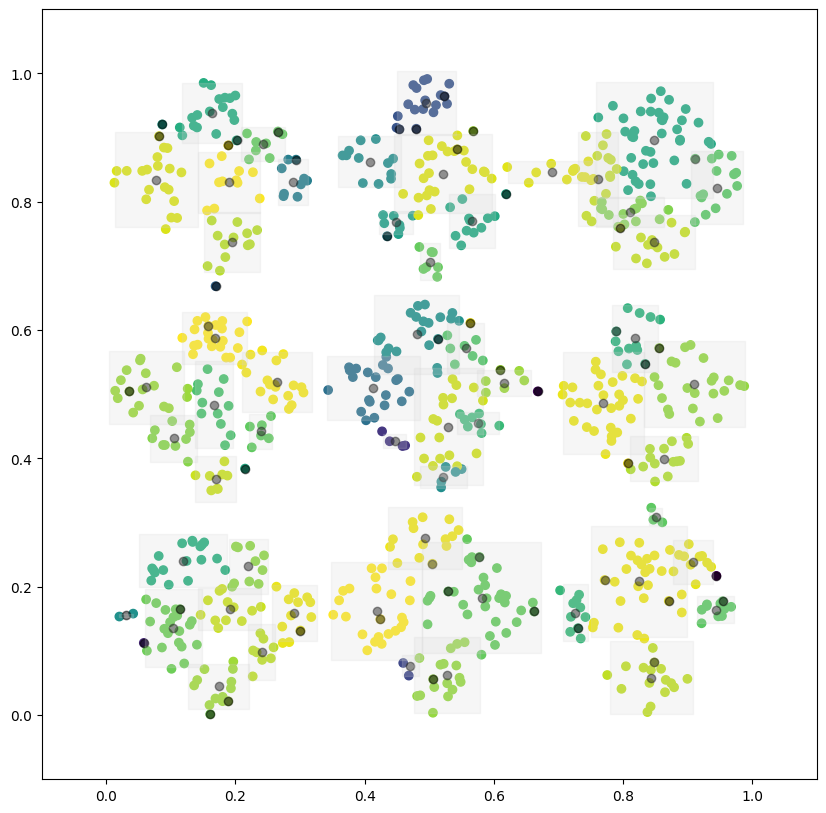

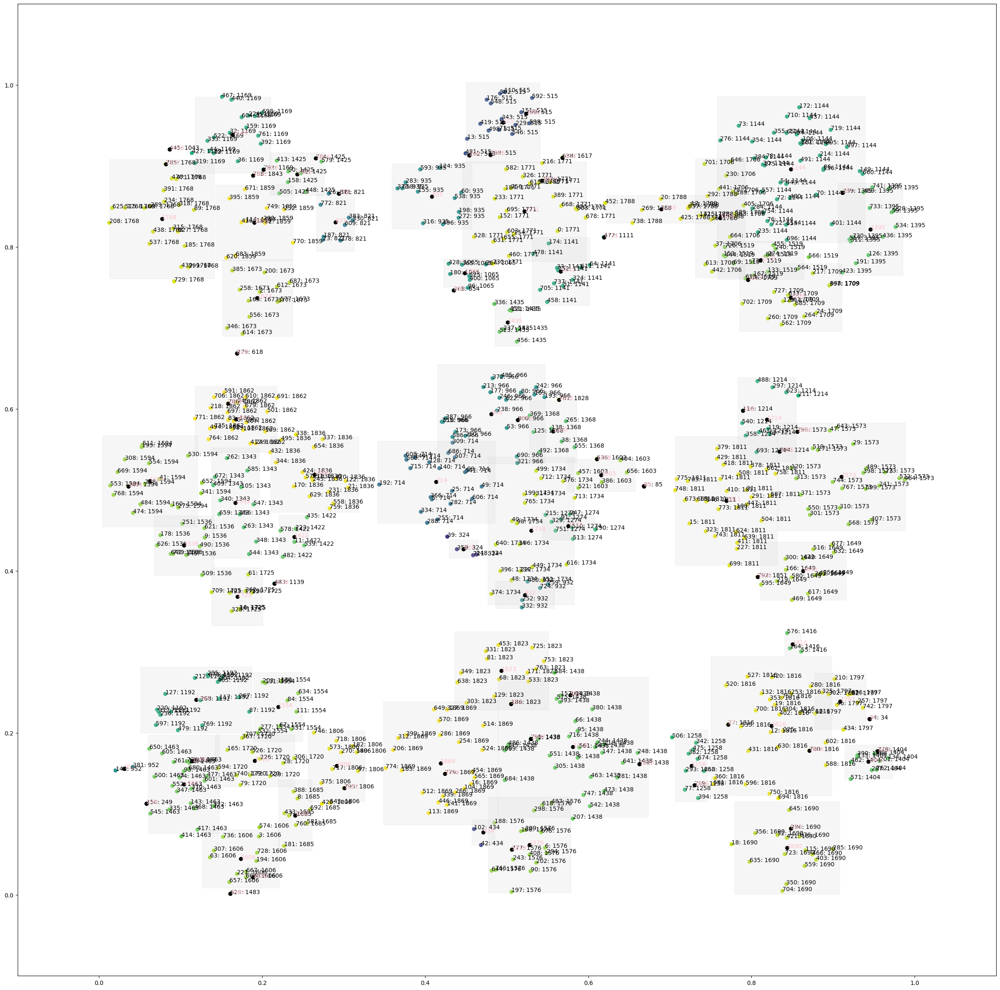

801 New DP: 1872, [{0: 0.46659745473252767, 1: 0.4372075513383047}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 801.]
802 New DP: 1874, [{0: 0.8316362072309884, 1: 0.9216883942884813}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 802.]
1874 directly inserted DP: 1144 [{0: 0.8481218120402421, 1: 0.8965892964183126}, extents=+/- {0: 0.09066474773350519, 1: 0.09013363590781132}, weight=42.0, time=Mean: 363.928571], 1874, True
803 New DP: 1876, [{0: 0.8091251802686952, 1: 0.22986748596060058}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 803.]
1876 directly inserted DP: 1816 [{0: 0.8236932911825172, 1: 0.20932091099958197}, extents=+/- {0: 0.07412266549179458, 1: 0.08611771211733354}, weight=26.0, time=Mean: 472.192308], 1876, True
804 New DP: 1878, [{0: 0.05426867836691324, 1: 0.18164273764985214}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 804.]
805 New DP: 1880, [{0: 0.23353006164978538, 1: 0.14481378333054912}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 805.]
1

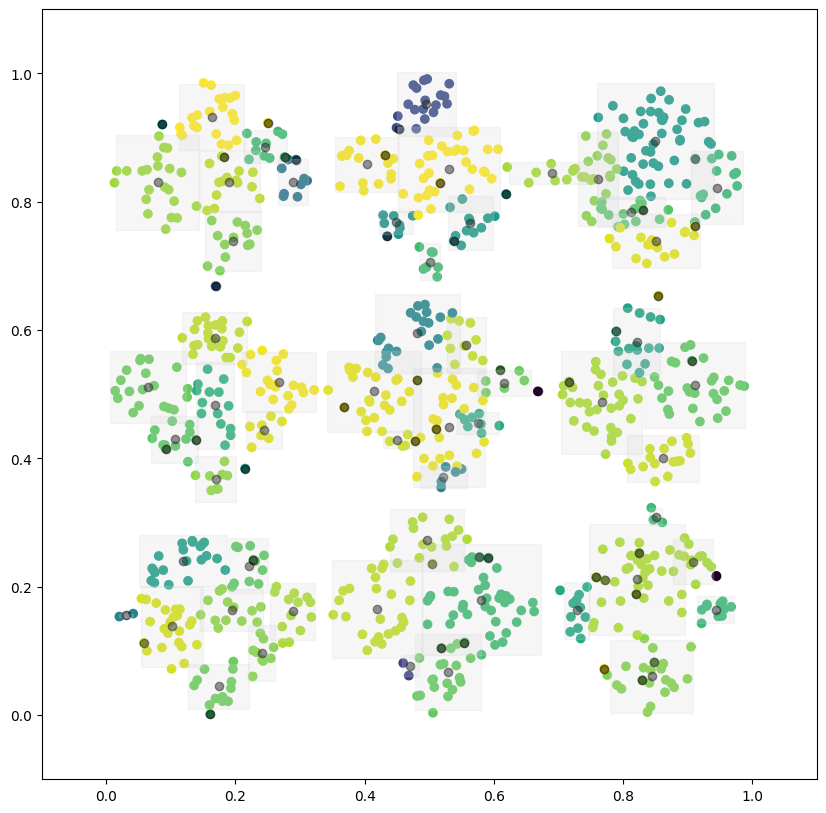

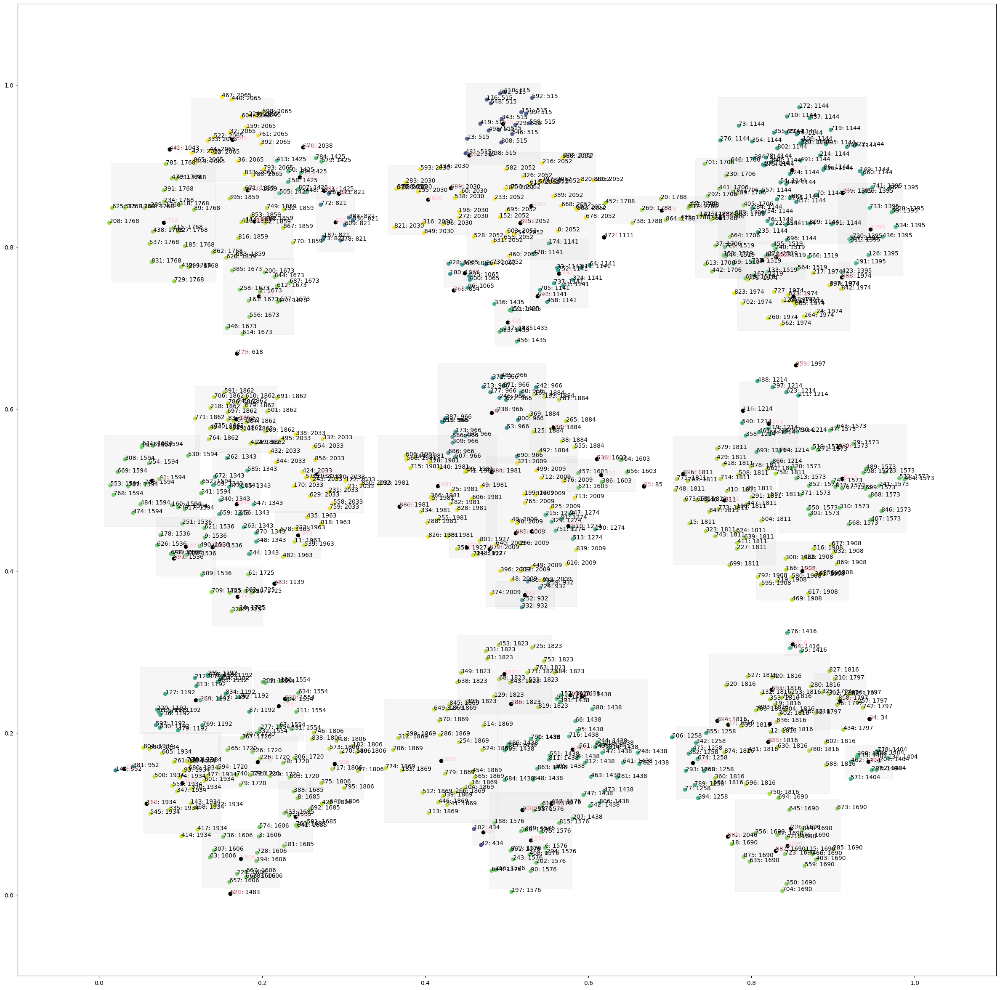

901 New DP: 2086, [{0: 0.10135359651860038, 1: 0.424033066330889}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 901.]
2086 directly inserted DP: 1536 [{0: 0.10572714374591699, 1: 0.42944045946798426}, extents=+/- {0: 0.03663968844321877, 1: 0.03647782955781098}, weight=13.0, time=Mean: 536.], 2086, True
902 New DP: 2088, [{0: 0.24496251254501444, 1: 0.14361408517806057}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 902.]
903 New DP: 2090, [{0: 0.8637143363160247, 1: 0.7361104569425096}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 903.]
2090 directly inserted DP: 1974 [{0: 0.8518708306275458, 1: 0.7391863671188166}, extents=+/- {0: 0.06873789837087196, 1: 0.04224110760693833}, weight=20.0, time=Mean: 581.25], 2090, True
2038 New MC 2038
2092 New MC merge: 1425 + 2038 -> 2092 [{0: 0.24650772098201107, 1: 0.8894589919048446}, extents=+/- {0: 0.03371876517299166, 1: 0.03353736308653332}, weight=11.0, time=Mean: 513.727273]
904 New DP: 2093, [{0: 0.14757828510706486, 1: 0.37347

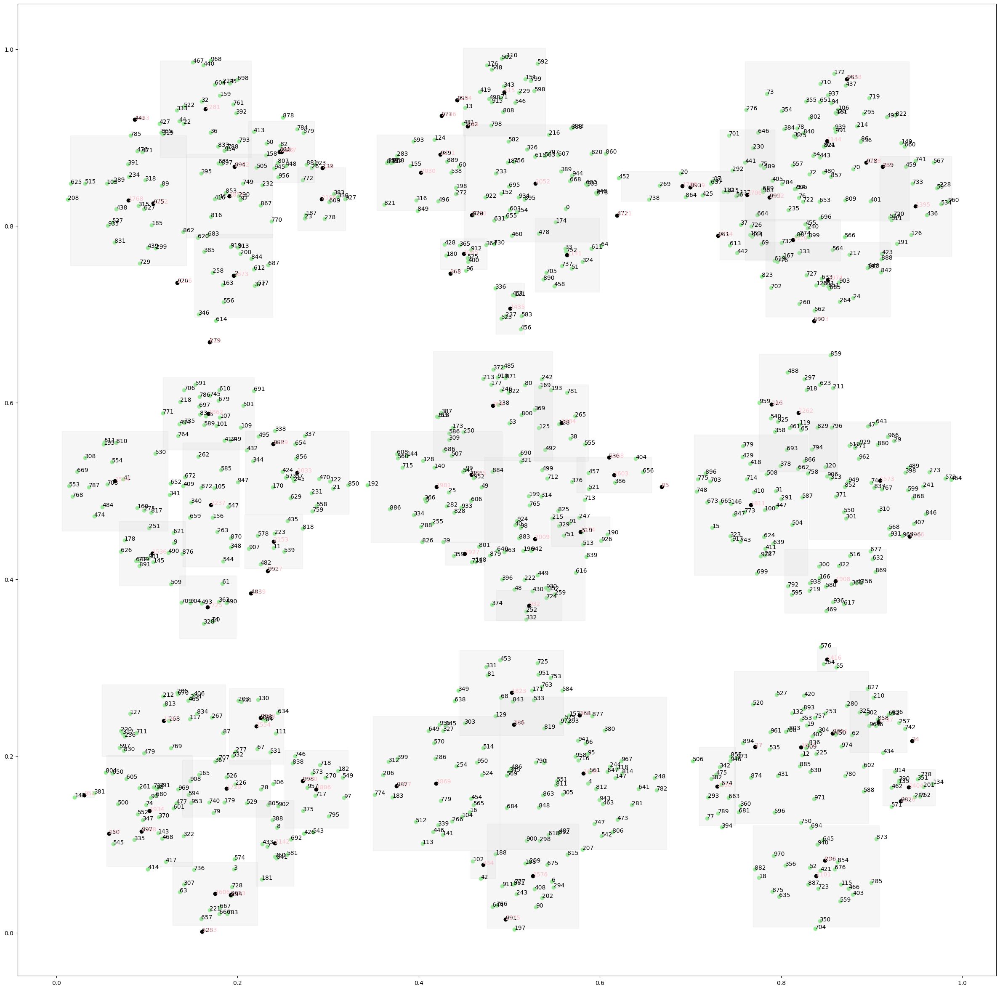

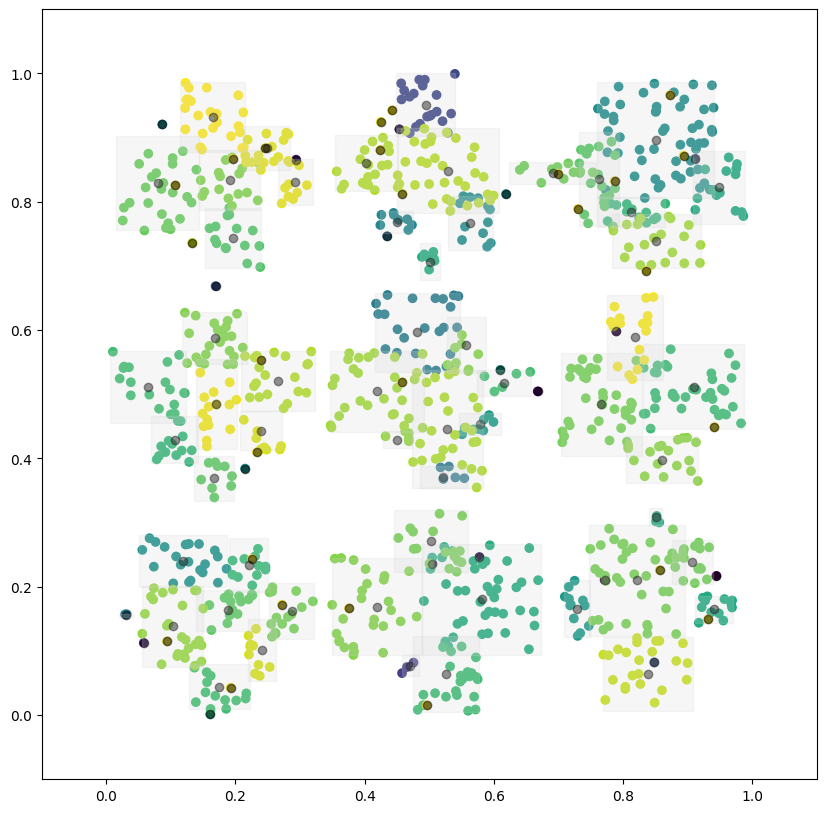

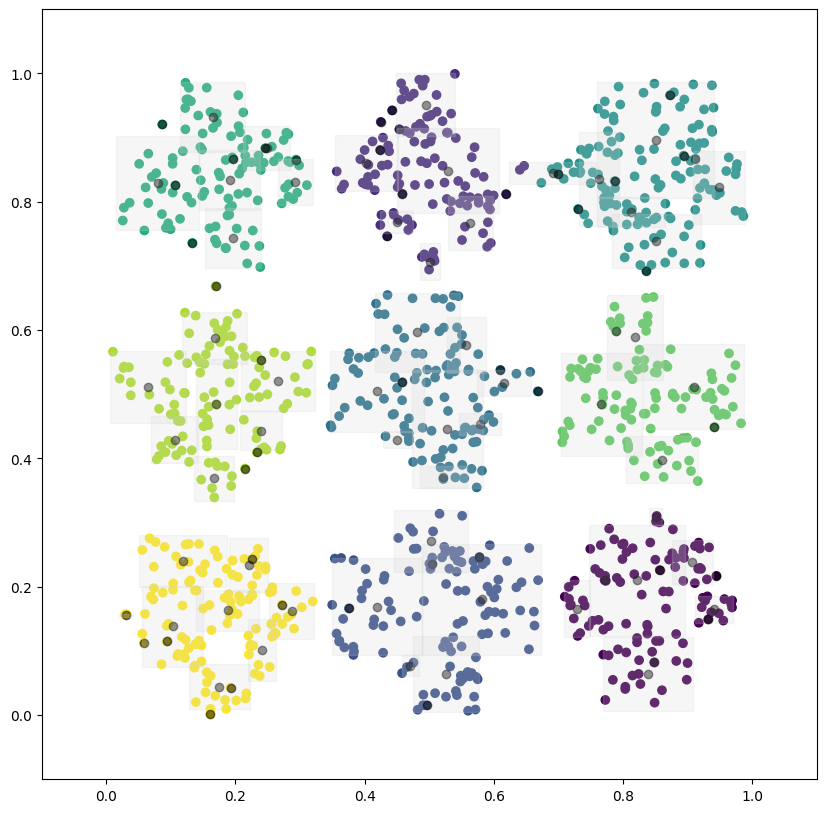

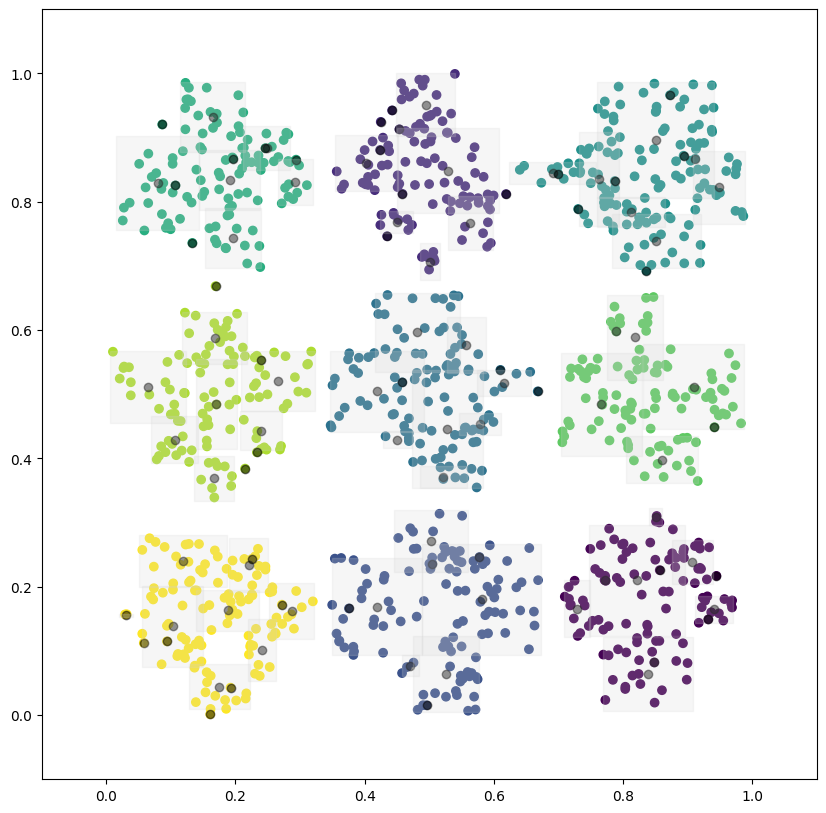

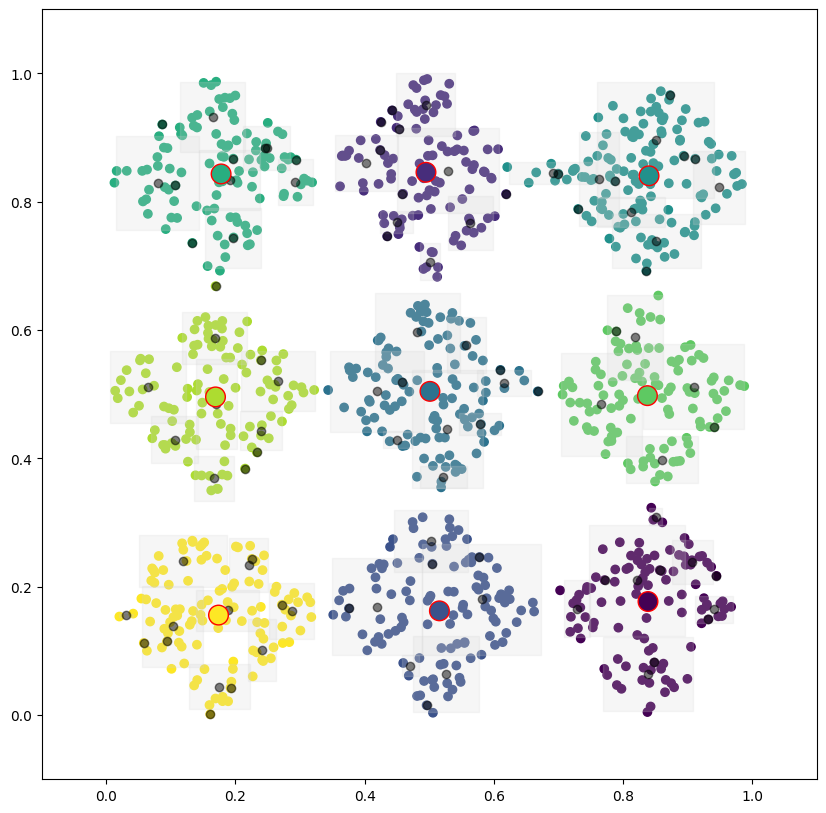

    0     1     2     3     4     5     6     7     8    
0     0     0     0     0     0     0     0     0   115  
1     0     0   113     0     0     0     0     0     0  
2   103     0     0     0     0     0     0     0     0  
3     0     0     0     0     0     0     0   110     0  
4     0     0     0   111     0     0     0     0     0  
5     0     0     0     0     0     0   106     0     0  
6     0     0     0     0     0   106     0     0     0  
7     0   104     0     0     3     0     0     0     0  
8     0     0     0     0   129     0     0     0     0  
Acc: 0.997 NMI: 0.9936217324984171 ARI: 0.9928965501340832 AMI: 0.9935256247858881 Pur.: 0.997 Prec.: 0.9930104031209362 Rec.: 0.9943573327545983 F1: 0.9936834114999864 Comp.: 0.9937661730342678 Fowl.: 0.9936836397188507 Homo.: 0.9934773339443459 Clu.Num.: 9 True Clu.Num 9


In [26]:
from method.offlineHandler import SCOPEOffline

scope = SCOPEOffline(n_macro_clusters=9, max_micro_clusters=100, max_singletons=25, sigma=0.5, mu=0.5, seed=0,
                     time_gap=10000, offline_datascale=1000)
i = 0
for x in X:
    dp = dict(enumerate(x))
    scope.learn_one(dp)
    if i % 100 == 0 and i > 0:
        scope.display_store()
    i += 1

plt.figure(figsize=(30, 30))
plt.scatter(X[:, 0], X[:, 1], c="lightgreen")
for i in range(len(X)):
    plt.text(X[i, 0], X[i, 1], i)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=1)
    plt.text(float(mccenter[0]), float(mccenter[1]), id, c="pink")

scope_labels_train = []

for x in X:
    dp = dict(enumerate(x))
    pred = scope.predict_one(dp)
    scope_labels_train.append(pred)

scope_centers = scope.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=scope_labels_train)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=0.5)
plt.scatter(scope_centers[:, 0], scope_centers[:, 1], c=range(len(scope_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, scope_labels_train))

In [27]:
from method.offlineHandler import SCOPEOffline

scope = SCOPEOffline(n_macro_clusters=9, max_micro_clusters=100, max_singletons=25, sigma=0.5, mu=0.5, seed=0,
                     time_gap=10000, offline_datascale=1000, dissolve=True)
for x in X:
    dp = dict(enumerate(x))
    scope.learn_one(dp)

scope.display_store()

plt.figure(figsize=(30, 30))
plt.scatter(X[:, 0], X[:, 1], c="lightgreen")
for i in range(len(X)):
    plt.text(X[i, 0], X[i, 1], i)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=1)
    plt.text(float(mccenter[0]), float(mccenter[1]), id, c="pink")

scope_labels_train = []

for x in X:
    dp = dict(enumerate(x))
    pred = scope.predict_one(dp)
    scope_labels_train.append(pred)

scope_centers = scope.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=scope_labels_train)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=0.5)
plt.scatter(scope_centers[:, 0], scope_centers[:, 1], c=range(len(scope_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, scope_labels_train))

74 New MC 74
100 New DP: 100, [{0: 0.7818238553464953, 1: 0.47836934573840306}, extents=+/- {0: 0, 1: 0}, weight=1.0, time=Mean: 100.]
75 New MC 75


AttributeError: 'SCOPEOffline' object has no attribute 'd'

In [ ]:
from method.offlineHandler import SCOPEOffline

scope = SCOPEOffline(n_macro_clusters=9, max_micro_clusters=100, max_singletons=3, sigma=0.5, mu=0.5, seed=0,
                     time_gap=10000, offline_datascale=1000)
for x in X:
    dp = dict(enumerate(x))
    scope.learn_one(dp)

scope.display_store()

plt.figure(figsize=(30, 30))
plt.scatter(X[:, 0], X[:, 1], c="lightgreen")
for i in range(len(X)):
    plt.text(X[i, 0], X[i, 1], i)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=1)
    plt.text(float(mccenter[0]), float(mccenter[1]), id, c="pink")

scope_labels_train = []

for x in X:
    dp = dict(enumerate(x))
    pred = scope.predict_one(dp)
    scope_labels_train.append(pred)

scope_centers = scope.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=scope_labels_train)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mcrange = dict_to_np(mc.extent)
    mc_patch = ptc.Rectangle((float(mccenter[0] - mcrange[0]), float(mccenter[1] - mcrange[1])), 2 * mcrange[0],
                             2 * mcrange[1], alpha=0.2, color="lightgrey")
    plt.gca().add_patch(mc_patch)
for id, mc in scope.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black", alpha=0.5)
plt.scatter(scope_centers[:, 0], scope_centers[:, 1], c=range(len(scope_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, scope_labels_train))

In [ ]:
print(scope.offline_dataset)

In [ ]:
ds_np = dps_to_np(scope.offline_dataset)
print(ds_np)
ds_opeclu = dps_to_np(genclustream.offline_dataset)
print(ds_opeclu)

In [ ]:
from similarity.BoP import BoP

bop = BoP(ref_data=X, n_prototype=100, cache_path="results")
truth_bop = bop.evaluate(X)
full_bop = bop.evaluate(X_test)
ope_clustream_bop = bop.evaluate(ds_opeclu)
scope_bop = bop.evaluate(ds_np)

print("JS", truth_bop['JS'], full_bop['JS'], ope_clustream_bop['JS'], scope_bop['JS'])
print("Hellinger", truth_bop['Hellinger'], full_bop['Hellinger'], ope_clustream_bop['Hellinger'],
      scope_bop['Hellinger'])
print("C2", truth_bop['C2'], full_bop['Hellinger'], ope_clustream_bop['C2'], scope_bop['C2'])

In [ ]:
from similarity.dataset_similarity_metrics import c2st_roc_auc

truth_c2st_roc = c2st_roc_auc(X, X)
full_c2st_roc = c2st_roc_auc(X, X_test)
ope_clustream_c2st_roc = c2st_roc_auc(X, ds_opeclu)
scope_c2st_roc = c2st_roc_auc(X, ds_np)

print("c2st ROC AUC", truth_c2st_roc, full_c2st_roc, ope_clustream_c2st_roc, scope_c2st_roc)

In [ ]:
from similarity.dataset_similarity_metrics import c2st_accuracy

truth_c2st_acc = c2st_accuracy(X, X)
full_c2st_acc = c2st_accuracy(X, X_test)
ope_clustream_c2st_acc = c2st_accuracy(X, ds_opeclu)
scope_c2st_acc = c2st_accuracy(X, ds_np)

print("c2st Accuracy", truth_c2st_acc, full_c2st_acc, ope_clustream_c2st_acc, scope_c2st_acc)

In [ ]:
from similarity.dataset_similarity_metrics import ks_test

truth_ks = ks_test(X, X)
full_ks = ks_test(X, X_test)
ope_clustream_ks = ks_test(X, ds_opeclu)
scope_ks = ks_test(X, ds_np)

print("KS", truth_ks[1], full_ks[1], ope_clustream_ks[1], scope_ks[1])
print("KS-full", truth_ks, full_ks, ope_clustream_ks, scope_ks)

In [ ]:
from similarity.dataset_similarity_metrics import zu_overfitting_statistic

truth_zu = zu_overfitting_statistic(X, X, X_test)
full_zu = zu_overfitting_statistic(X, X_test, X_test)
ope_clustream_zu = zu_overfitting_statistic(X, ds_opeclu, X_test)
scope_zu = zu_overfitting_statistic(X, ds_np, X_test)

print("RBF MMD", truth_zu, full_zu, ope_clustream_zu, scope_zu)

In [ ]:
import copy
from river import utils
from method.SCOPE import SCOPEMicroCluster


def _distance(point_a, point_b):
    return utils.math.minkowski_distance(point_a, point_b, 2)


def get_parent(mc_a: SCOPEMicroCluster, mc_b: SCOPEMicroCluster):
    parent = SCOPEMicroCluster(x=mc_a.x, w=mc_a.w, timestamp=mc_a.timestamp, var_time=copy.deepcopy(mc_a.var_time),
                               var_x=copy.deepcopy(mc_a.var_x))
    #parent.add_data(mc_a.weight)
    #print(mc_a, parent)
    parent += mc_b
    radius_a = _distance(mc_a.center, parent.center) + mc_a.radius()
    radius_b = _distance(mc_b.center, parent.center) + mc_b.radius()
    radius = max(radius_a, radius_b)
    parent.r = radius
    return parent


def get_half_parent(mc_a: SCOPEMicroCluster, mc_b: SCOPEMicroCluster):  # parent with only weights from mc_a
    actual_parent = get_parent(mc_a, mc_b)
    half_parent = SCOPEMicroCluster(x=actual_parent.center, w=mc_a.weight, timestamp=mc_a.timestamp,
                                    var_time=mc_a.var_time, r=actual_parent.r)
    return half_parent

In [ ]:
mc_a = SCOPEMicroCluster({0: 0, 1: 0}, w=1.0, r=0.1, timestamp=1)

mc_b = SCOPEMicroCluster({0: 1, 1: 0}, w=1.0, r=0.1, timestamp=2)

mc_a.insert({0: 0, 1: 0.0}, w=1.0, timestamp=4)

#mc_b.insert({0:0.7, 1:1}, w=1.0, timestamp=3)

print(mc_a)
print(mc_b)
mc_parent = get_parent(mc_a, mc_b)
print(mc_parent)

#mc_a.insert({0:0, 1:1}, w=1.0, timestamp=4)

print(mc_a)
print(mc_parent)

mc_half_parent = get_half_parent(mc_a, mc_b)
print(mc_half_parent)

In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000,
                            offline_datascale=1000, offline_algo="XMeans")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
xmeans = XMeans(random_state=0, allow_merging=True, check_global_score=False)
clustering = xmeans.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(xmeans.cluster_centers_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="DBHD", offline_args={"min_cluster_size": 50, "rho": 1.2, "beta": 0.2})
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
dbhd = DBHD(min_cluster_size=50, rho=1.2, beta=0.2)
clustering = dbhd.fit_predict(X)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="Spectral")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import SpectralClustering

spectral = SpectralClustering(n_clusters=9)
clustering = spectral.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
seed = 1
np.random.seed = seed
print(np.random.random_integers(100, size=10))

In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="DBSCAN", offline_args={"eps": 0.05, "min_samples": 10})
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.05, min_samples=10)
clustering = dbscan.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="OPTICS", offline_args={"min_samples": 10})
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import OPTICS

optics = OPTICS(min_samples=10)
clustering = optics.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="MeanShift")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
kmeans = KMeans(n_clusters=9, random_state=0)
clustering = kmeans.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(kmeans.cluster_centers_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="HDBSCAN")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c=range(len(clustream_centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
hdbscan = HDBSCAN(store_centers='centroid')
clustering = hdbscan.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)
centers = np.array(hdbscan.centroids_)
plt.scatter(centers[:, 0], centers[:, 1], c=range(len(centers)), s=200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
from method.offlineHandler import GenCluStream

genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000,
                            offline_algo="Agglomerative")
for x in X:
    dp = dict(enumerate(x))
    genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
    dp = dict(enumerate(x))
    pred = genclustream.predict_one(dp)
    genclustream_labels_train.append(pred)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, genclustream_labels_train))

In [ ]:
from sklearn.cluster import AgglomerativeClustering

agglomerative = AgglomerativeClustering(n_clusters=9)
clustering = agglomerative.fit_predict(X, None)

plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustering)

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

print(printMetrics(y, clustering))


In [ ]:
hdbscan = HDBSCAN()
hdbscan_trueclustering = hdbscan.fit_predict(X, y)
plt.scatter(X[:, 0], X[:, 1], c=hdbscan_trueclustering)
plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()

hdbscan = HDBSCAN()
hdbscan_offclustering = hdbscan.fit_predict(new_ds[:, 0:2], new_ds[:, 2])
plt.scatter(new_ds[:, 0], new_ds[:, 1], c=hdbscan_offclustering)
print(hdbscan_offclustering)
for mc in clustream_mcs:
    mc_patch = ptc.Circle((mc[0], mc[1]), 2 * mc[2], alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
plt.scatter(clustream_centers[:, 0], clustream_centers[:, 1], c="black")
plt.scatter(clustream_mcs[:, 0], clustream_mcs[:, 1], c="grey", s=clustream_mcs[:, 3])
plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()